<a href="https://colab.research.google.com/github/GreNinja47/Time-Series-Forecasting-of-Sales-and-Consumer-purchase-/blob/main/Forecasting_Time_Series_SARIMAX_LSTM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
## Read google drive file
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# Problem Statement

# Rossmann is a European drug distributor which operates over 3,000 drug stores across seven European countries. Since a lot of drugs come with a short shelf life, that is, they do not have a long expiry
# date, it becomes imperative for Rossmann to accurately forecast sales at their individual stores. Currently, the forecasting is taken care of by the store managers who are tasked with forecasting daily
# sales for the next six weeks.

# As expected, store sales are influenced by many factors, including promotional campaigns, competition, state holidays, seasonality, and locality.

# With thousands of individual managers predicting sales based on their unique circumstances and intuitions, the accuracy of the forecasts is quite varied. To overcome this problem,
# the company has hired you as a data scientist to work on the forecasting problem. As part of your job role, you are tasked with building a forecasting model to forecast the daily sales for the
# next six weeks. To help you with the same, you have been provided with historical sales data for 1,115 Rossmann stores.

In [ ]:
#importing the libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import datetime
from matplotlib.pyplot import rcParams
from statsmodels.tsa.stattools import grangercausalitytests
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
from statsmodels.tsa.api import VAR
from sklearn.preprocessing import MinMaxScaler
from statsmodels.graphics.tsaplots import plot_pacf
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.vector_ar.vecm import coint_johansen #Johansen Cointegration test

In [ ]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [ ]:
df_store = pd.read_csv("/content/gdrive/MyDrive/TS_Forecaset_Dataset/store.csv")
d_par = lambda x: pd.datetime.strptime(x, '%Y-%m-%d')
df_train = pd.read_csv("/content/gdrive/MyDrive/TS_Forecaset_Dataset/train.csv", parse_dates=['Date'], date_parser=d_par)

In [ ]:
df_store.head()

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


In [ ]:
df_store.shape

(1115, 10)

In [ ]:
df_store.isna().sum()/len(df_store)*100

Store                         0.000000
StoreType                     0.000000
Assortment                    0.000000
CompetitionDistance           0.269058
CompetitionOpenSinceMonth    31.748879
CompetitionOpenSinceYear     31.748879
Promo2                        0.000000
Promo2SinceWeek              48.789238
Promo2SinceYear              48.789238
PromoInterval                48.789238
dtype: float64

In [ ]:
df_train.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


In [ ]:
df_train.shape

(1017209, 9)

In [ ]:
df_train.isna().sum()/len(df_store)*100

Store            0.0
DayOfWeek        0.0
Date             0.0
Sales            0.0
Customers        0.0
Open             0.0
Promo            0.0
StateHoliday     0.0
SchoolHoliday    0.0
dtype: float64

In [ ]:
# selecting 2 stores
selected_stores_ids=[1]
df_train_stores=df_train[df_train.Store.isin(selected_stores_ids)]
df_train_stores.shape

(942, 9)

In [ ]:
df_train_stores.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1115,1,4,2015-07-30,5020,546,1,1,0,1
2230,1,3,2015-07-29,4782,523,1,1,0,1
3345,1,2,2015-07-28,5011,560,1,1,0,1
4460,1,1,2015-07-27,6102,612,1,1,0,1


In [ ]:
df = pd.merge(df_train_stores, df_store, how = 'inner', on = 'Store')
df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
2,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
3,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
4,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN


In [ ]:
df.tail()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
937,1,6,2013-01-05,4997,635,1,0,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
938,1,5,2013-01-04,4486,619,1,0,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
939,1,4,2013-01-03,4327,578,1,0,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
940,1,3,2013-01-02,5530,668,1,0,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
941,1,2,2013-01-01,0,0,0,0,a,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN


In [ ]:
df.shape

(942, 18)

In [ ]:
df.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear
count,942.0,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.0,942.0,942.0,942.0,0.0,0.0
mean,1.0,3.997877,3945.704883,467.646497,0.829087,0.382166,0.204883,1270.0,9.0,2008.0,0.0,NaN,NaN
std,0.0,1.998404,2015.417840,228.930850,0.376633,0.486175,0.403831,0.0,0.0,0.0,0.0,NaN,NaN
min,1.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1270.0,9.0,2008.0,0.0,NaN,NaN
25%,1.0,2.000000,3588.250000,463.000000,1.000000,0.000000,0.000000,1270.0,9.0,2008.0,0.0,NaN,NaN
50%,1.0,4.000000,4373.500000,529.000000,1.000000,0.000000,0.000000,1270.0,9.0,2008.0,0.0,NaN,NaN
75%,1.0,6.000000,5220.000000,598.750000,1.000000,1.000000,0.000000,1270.0,9.0,2008.0,0.0,NaN,NaN
max,1.0,7.000000,9528.000000,1130.000000,1.000000,1.000000,1.000000,1270.0,9.0,2008.0,0.0,NaN,NaN


In [ ]:
df.isnull().sum()/len(df)*100

Store                          0.0
DayOfWeek                      0.0
Date                           0.0
Sales                          0.0
Customers                      0.0
Open                           0.0
Promo                          0.0
StateHoliday                   0.0
SchoolHoliday                  0.0
StoreType                      0.0
Assortment                     0.0
CompetitionDistance            0.0
CompetitionOpenSinceMonth      0.0
CompetitionOpenSinceYear       0.0
Promo2                         0.0
Promo2SinceWeek              100.0
Promo2SinceYear              100.0
PromoInterval                100.0
dtype: float64

In [ ]:
null_cols =  df[['Promo2SinceWeek', 'Promo2SinceYear', 'PromoInterval']]

In [ ]:
null_cols.describe()

,Promo2SinceWeek,Promo2SinceYear
count,0.0,0.0
mean,NaN,NaN
std,NaN,NaN
min,NaN,NaN
25%,NaN,NaN
50%,NaN,NaN
75%,NaN,NaN
max,NaN,NaN


In [ ]:
df['Promo2SinceWeek'].value_counts()

Series([], Name: Promo2SinceWeek, dtype: int64)

In [ ]:
df['Promo2SinceYear'].value_counts()

Series([], Name: Promo2SinceYear, dtype: int64)

In [ ]:
df['PromoInterval'].value_counts()

Series([], Name: PromoInterval, dtype: int64)

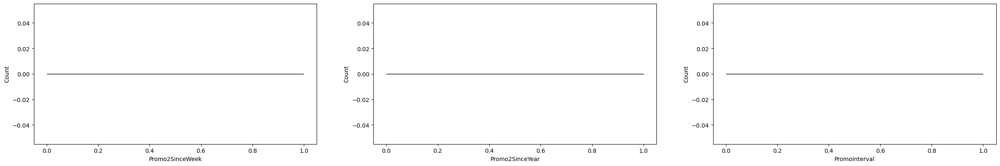

In [ ]:
plt.figure(figsize = [30,15])
for i in enumerate(null_cols):
    plt.subplot(3,3,i[0]+1)
    sns.histplot(df[i[1]])

In [ ]:
for i in null_cols:
    df[i].fillna(0, inplace=True)

In [ ]:
df.isnull().sum()/len(df)*100

Store                        0.0
DayOfWeek                    0.0
Date                         0.0
Sales                        0.0
Customers                    0.0
Open                         0.0
Promo                        0.0
StateHoliday                 0.0
SchoolHoliday                0.0
StoreType                    0.0
Assortment                   0.0
CompetitionDistance          0.0
CompetitionOpenSinceMonth    0.0
CompetitionOpenSinceYear     0.0
Promo2                       0.0
Promo2SinceWeek              0.0
Promo2SinceYear              0.0
PromoInterval                0.0
dtype: float64

In [ ]:
# Collecting the categorical and numerical columns

cat_cols = df.dtypes[(df.dtypes == "object")].index.to_list()
num_cols = df.dtypes[(df.dtypes == "float64") | (df.dtypes == "int64") | (df.dtypes == "int32")].index.to_list()

print("CATEGORICAL FEATURES : \n {} \n\n".format(cat_cols))
print("NUMERICAL FEATURES : \n {} \n\n".format(num_cols))

CATEGORICAL FEATURES : 
 ['StateHoliday', 'StoreType', 'Assortment'] 


NUMERICAL FEATURES : 
 ['Store', 'DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday', 'CompetitionDistance', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'PromoInterval'] 




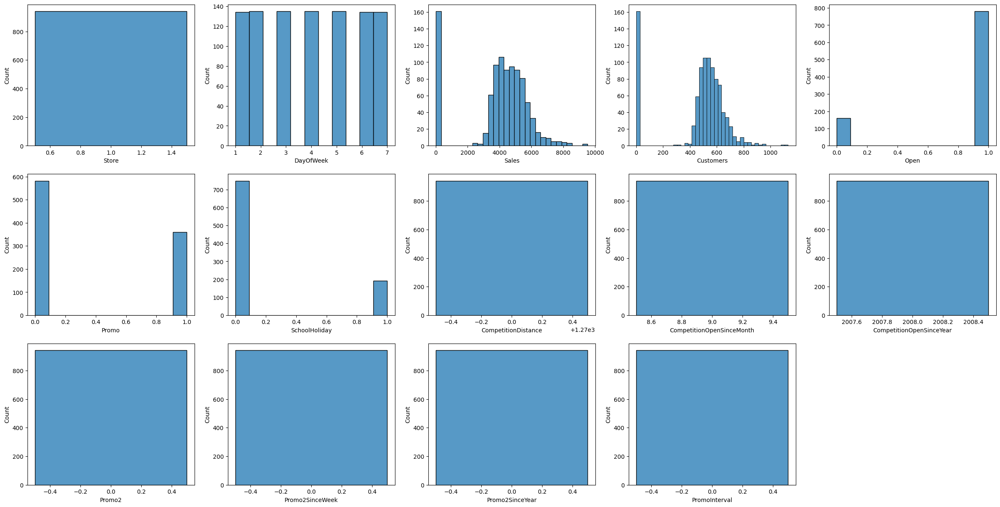

In [ ]:
plt.figure(figsize = [30,15])
feature = num_cols
for i in enumerate(feature):
    plt.subplot(3,5,i[0]+1)
    sns.histplot(df[i[1]])

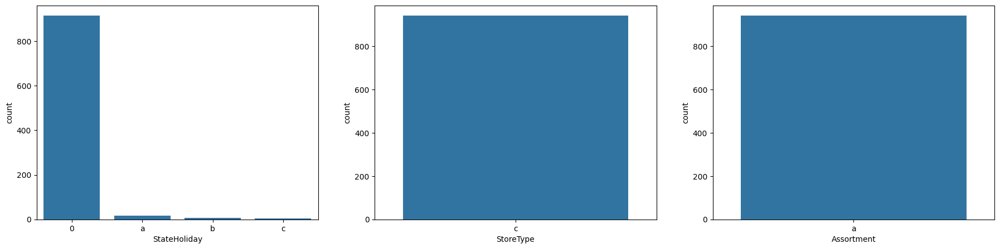

In [ ]:
plt.figure(figsize=[30, 5])
feature = cat_cols

for i, col in enumerate(feature):
    plt.subplot(1, 4, i + 1)
    sns.countplot(data=df, x=col)

plt.show()

# StateHoliday indicates a state holiday. Normally all stores, with few exceptions, are closed on state holidays. Note that all schools are closed on public holidays and weekends.
# a = public holiday, b = Easter holiday, c = Christmas, 0 = None

# StoreType - differentiates between 4 different store models: a, b, c, d

# Assortment - describes an assortment level: a = basic, b = extra, c = extended

# PromoInterval - describes the consecutive intervals Promo2 is started, naming the months the promotion is started anew. E.g. "Feb,May,Aug,Nov" means each round starts in February, May, August, November of any given year for that store

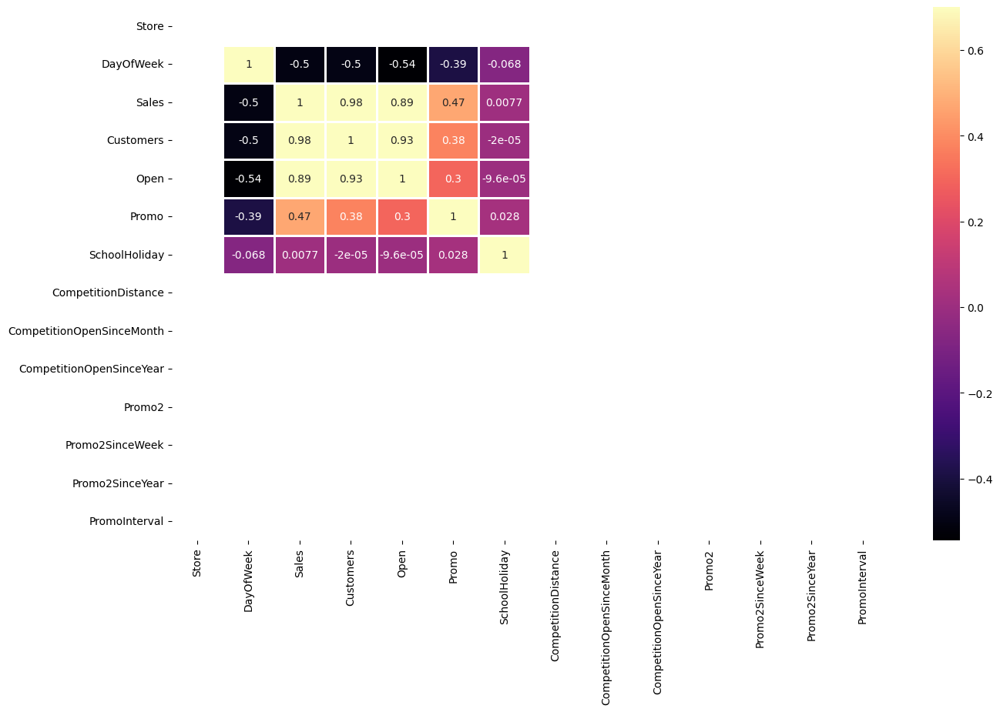

In [ ]:
# Checking the correlation matrix
corrmat = df.corr()
f, ax = plt.subplots(figsize=(15, 9))
sns.heatmap(corrmat, vmax=.7,cmap="magma",linewidth =1, annot=True)
plt.show()

In [ ]:
corr_target = abs(corrmat["Sales"])
# Selecting highly positively correlated features
relevant_positive_feature = corr_target.sort_values(ascending=False)
relevant_positive_feature

Sales                        1.000000
Customers                    0.984341
Open                         0.889360
DayOfWeek                    0.502143
Promo                        0.471333
SchoolHoliday                0.007692
Store                             NaN
CompetitionDistance               NaN
CompetitionOpenSinceMonth         NaN
CompetitionOpenSinceYear          NaN
Promo2                            NaN
Promo2SinceWeek                   NaN
Promo2SinceYear                   NaN
PromoInterval                     NaN
Name: Sales, dtype: float64

Observation : We have 4 features that contributes above 50% correlation with Sales data : Customers, Open, DayOfWeek, Promo which needs to be further examined

In [ ]:
data_review = df[['Customers', 'Open', 'DayOfWeek', 'Promo']]
data_review.head()

,Customers,Open,DayOfWeek,Promo
0,555,1,5,1
1,546,1,4,1
2,523,1,3,1
3,560,1,2,1
4,612,1,1,1


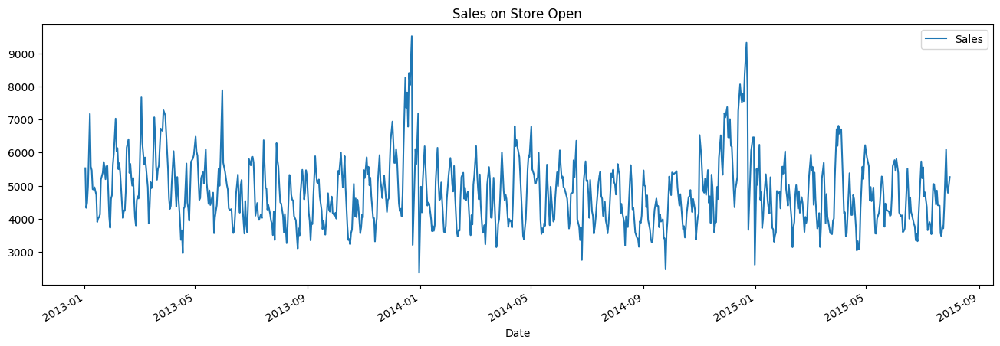

In [ ]:
# Store open days
df[df.Open == 1].plot(x="Date",y='Sales',figsize = (16,5))
plt.title('Sales on Store Open')

plt.show(block=False)

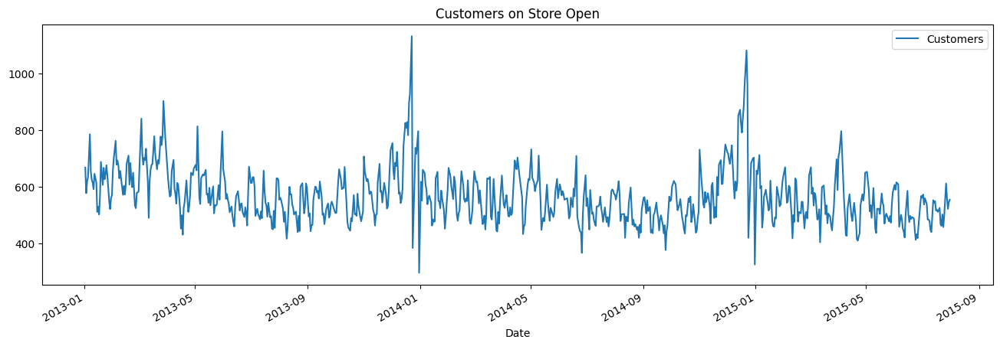

In [ ]:
# Store open days
df[df.Open == 1].plot(x="Date",y='Customers',figsize = (16,5))
plt.title('Customers on Store Open')

plt.show(block=False)

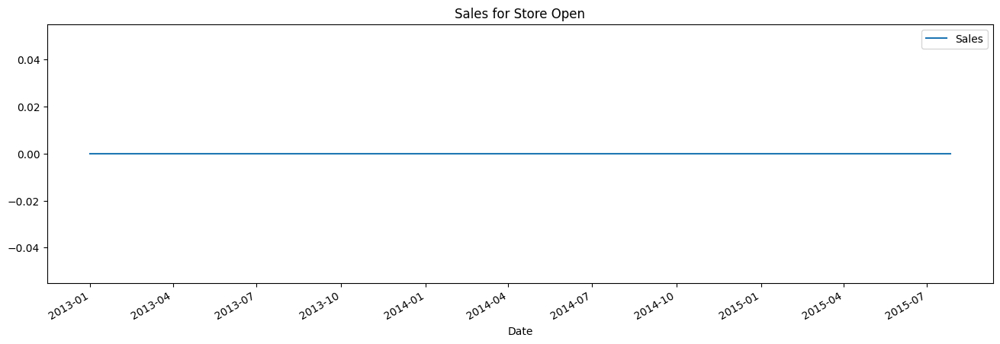

In [ ]:
# Sales on Store closed days
df[df.Open == 0].plot(x="Date",y='Sales',figsize = (16,5))
plt.title('Sales for Store Open')

plt.show(block=False)

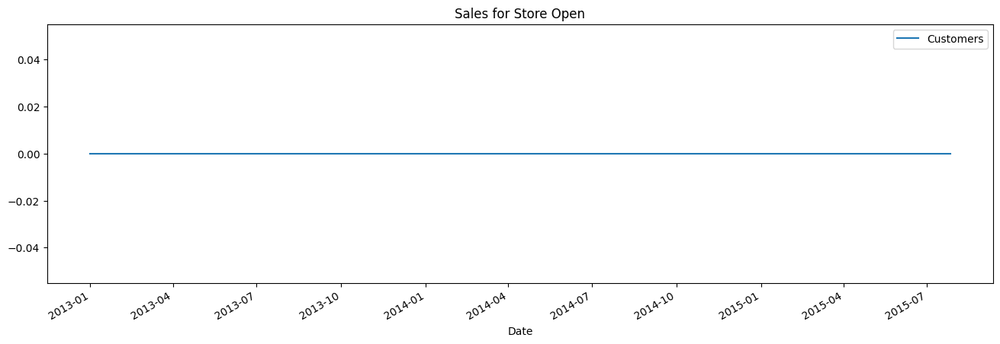

In [ ]:
# Store closed days
df[df.Open == 0].plot(x="Date",y='Customers',figsize = (16,5))
plt.title('Sales for Store Open')

plt.show(block=False)

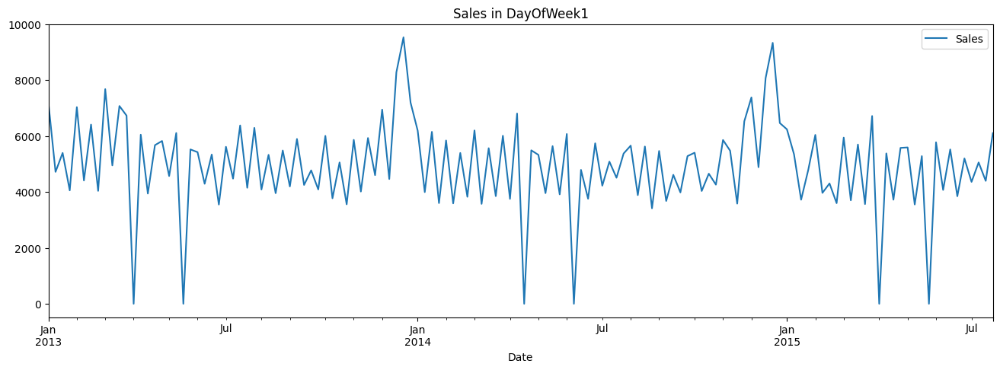

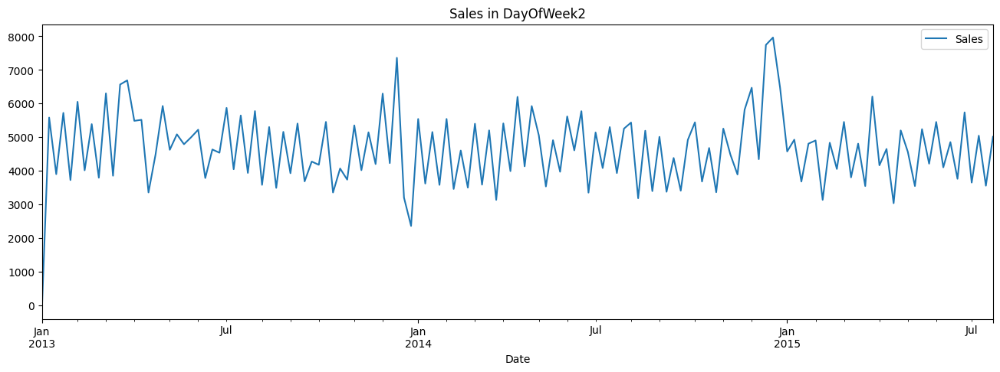

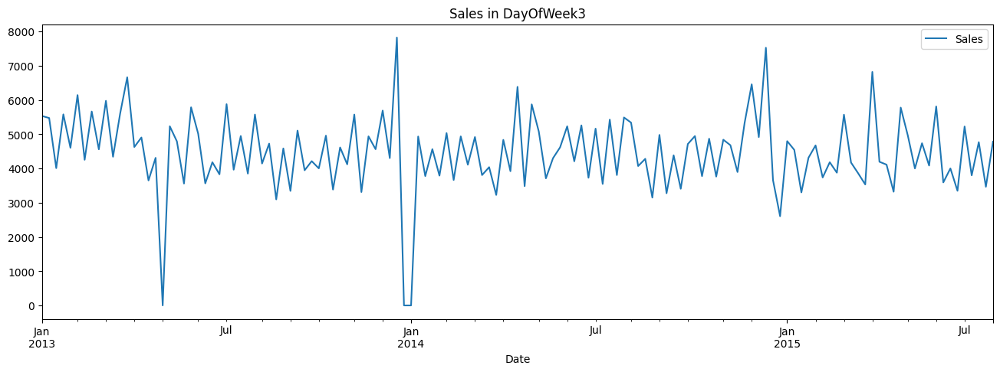

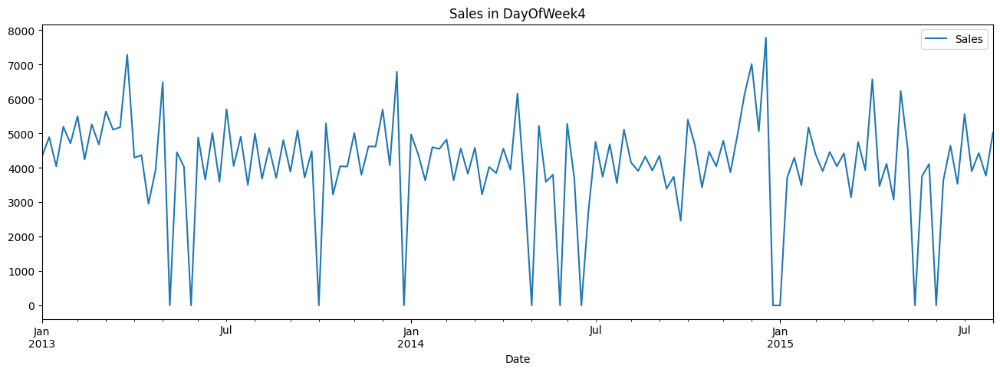

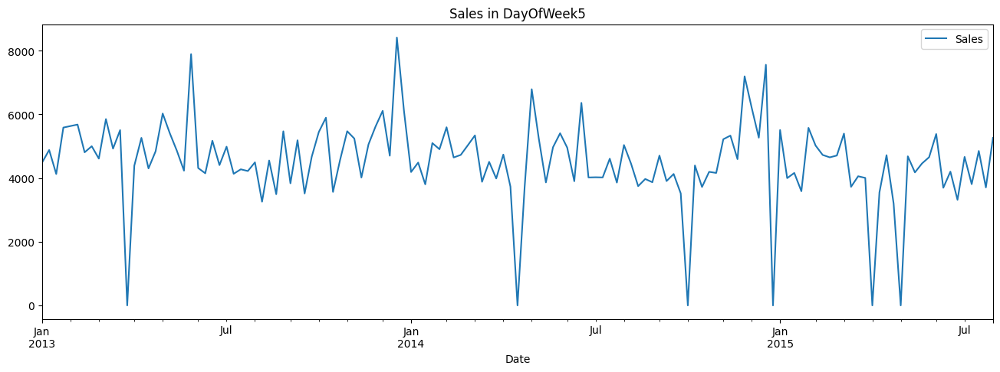

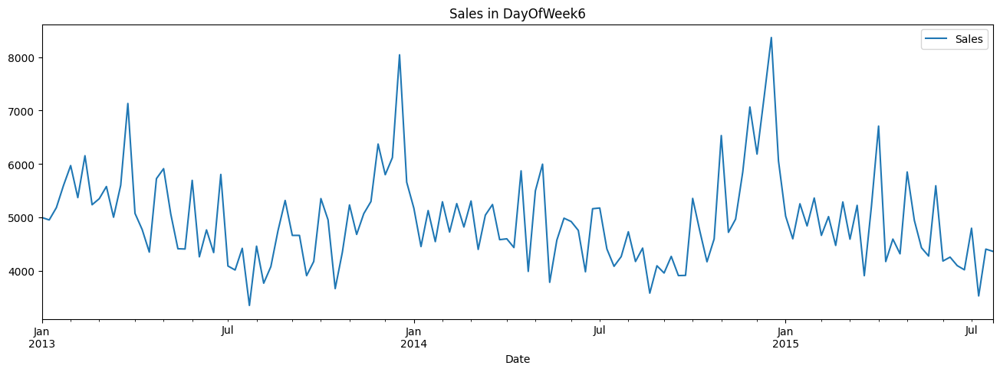

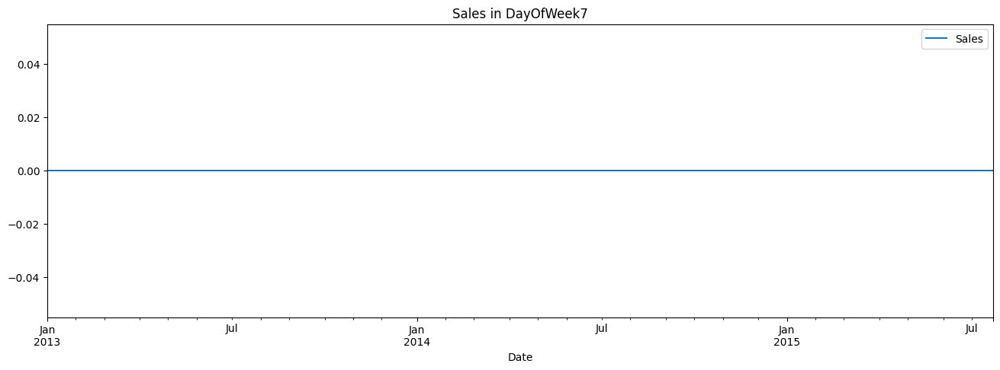

In [ ]:
# Sales pattern seen during every week days
for i in sorted(df['DayOfWeek'].unique()):
    df[df.DayOfWeek == i].plot(x="Date",y='Sales',figsize = (16,5))
    plt.title('Sales in DayOfWeek'+str(i))
    plt.show(block=False)
    # DayOfWeek - Describes the day of the week (1 - Monday till 7 - Sunday)

In [ ]:
# Group by 'DayOfWeek' mean sales
daily_sales_mean = df.groupby('DayOfWeek')['Sales'].mean()
daily_sales_mean

DayOfWeek
1    4946.119403
2    4650.918519
3    4454.474074
4    4094.607407
5    4516.414815
6    4942.970149
7       0.000000
Name: Sales, dtype: float64

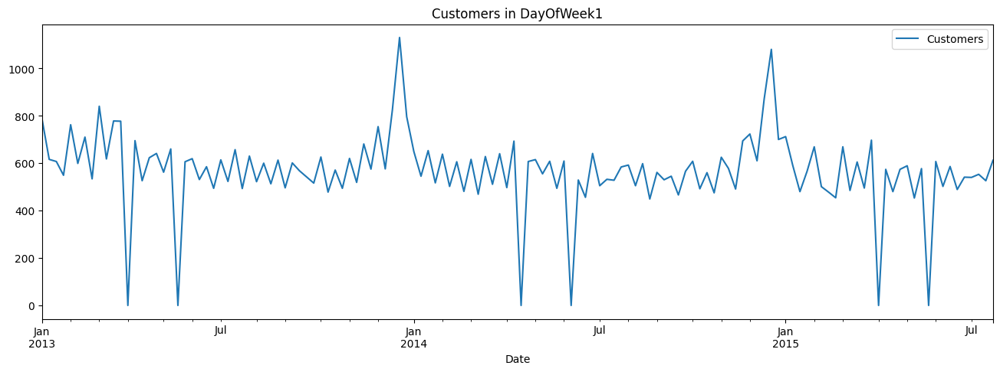

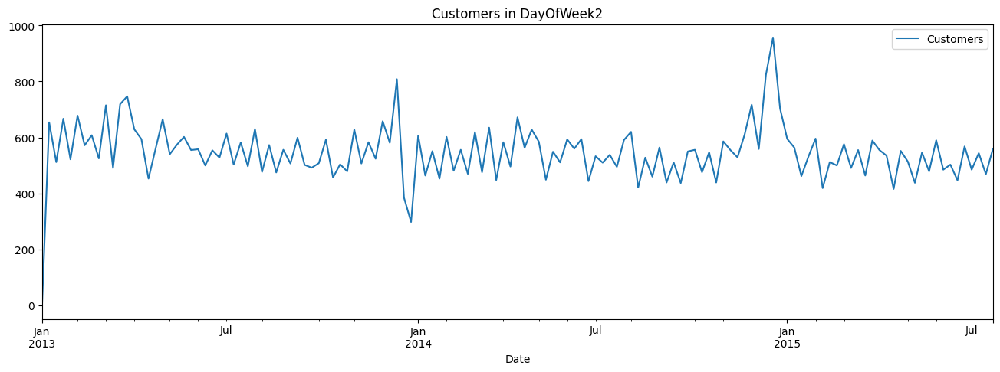

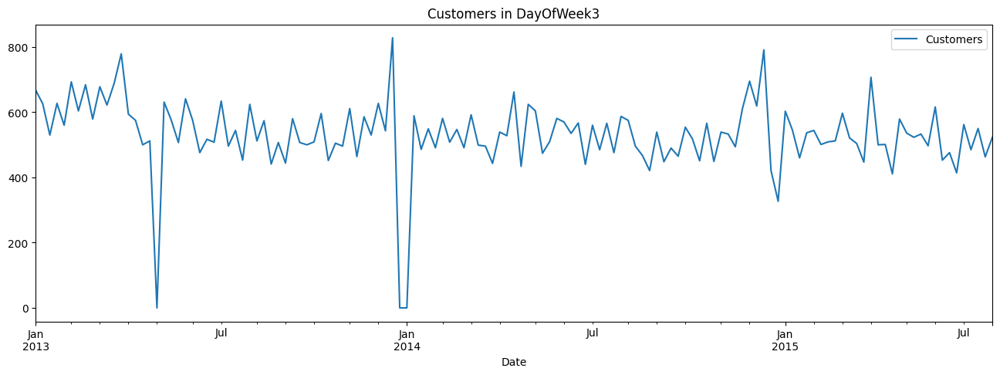

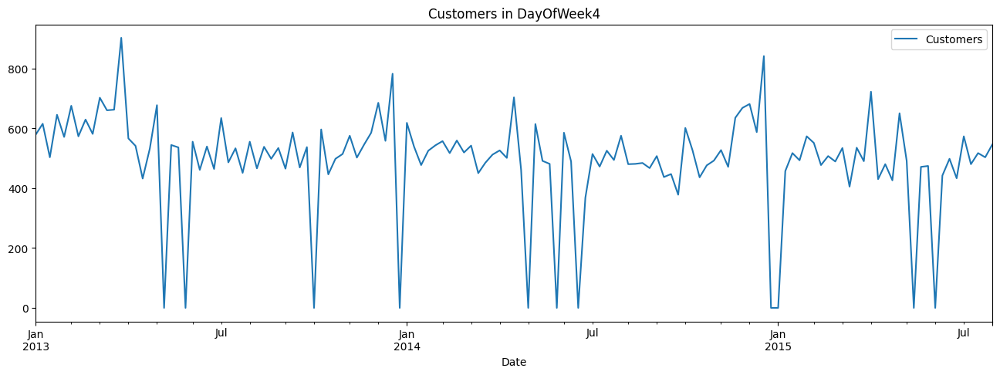

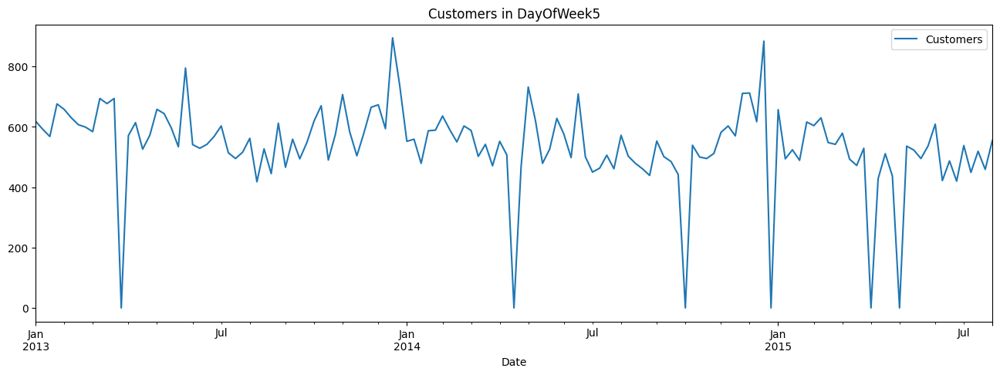

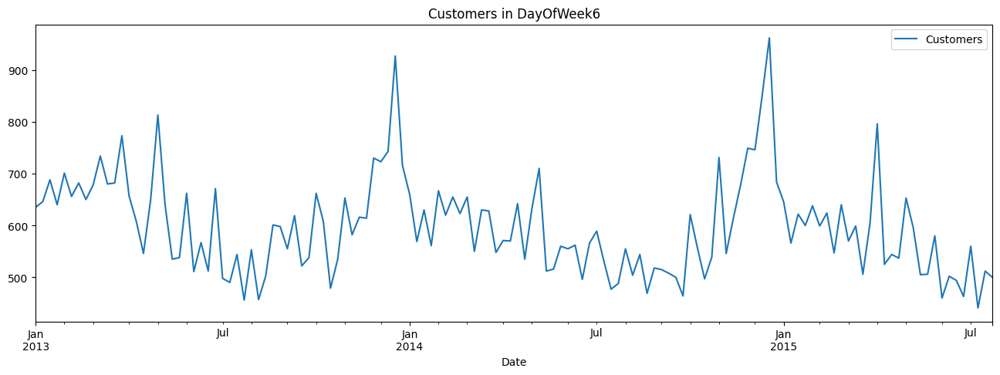

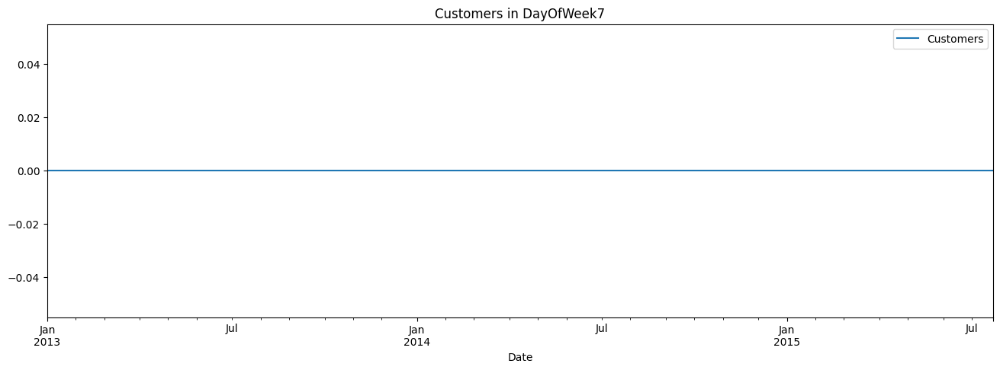

In [ ]:
# Customers pattern seen during every week days
for i in sorted(df['DayOfWeek'].unique()):
    df[df.DayOfWeek == i].plot(x="Date",y='Customers',figsize = (16,5))
    plt.title('Customers in DayOfWeek'+str(i))
    plt.show(block=False)
    # DayOfWeek - Describes the day of the week (1 - Monday till 7 - Sunday)

In [ ]:
# Group by 'DayOfWeek' mean customers
daily_cust_mean = df.groupby('DayOfWeek')['Customers'].mean()
daily_cust_mean

DayOfWeek
1    567.768657
2    545.370370
3    530.407407
4    493.407407
5    537.259259
6    597.552239
7      0.000000
Name: Customers, dtype: float64

Observations :

#####We see the sales and customers having the high volumes at opening week dates (Monday) and gradually decreasing till (Saturday). Sunday seems to be a Stores off

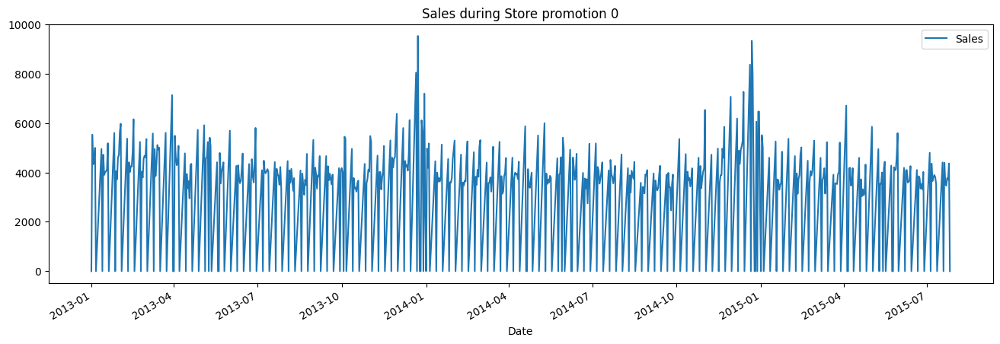

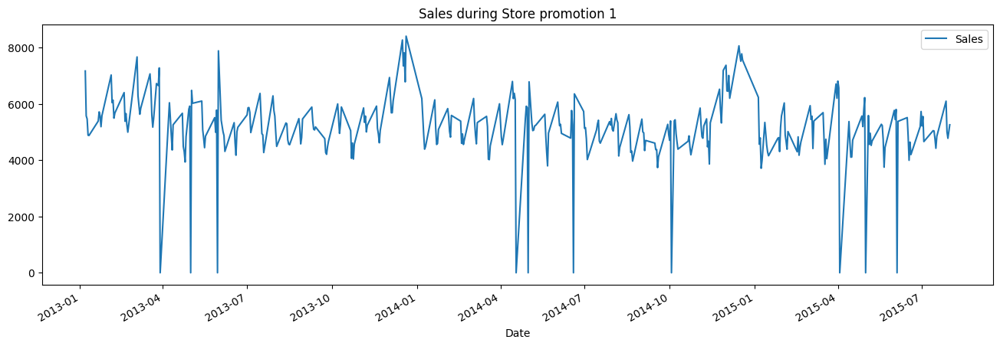

In [ ]:
# Sales during Store promotion
for i in sorted(df['Promo'].unique()):
  df[df.Promo == i].plot(x="Date",y='Sales',figsize = (16,5))
  plt.title('Sales during Store promotion '+str(i))

  plt.show(block=False)
  # 0 Store didn't had the promotion
  # 1 Store had the promotion

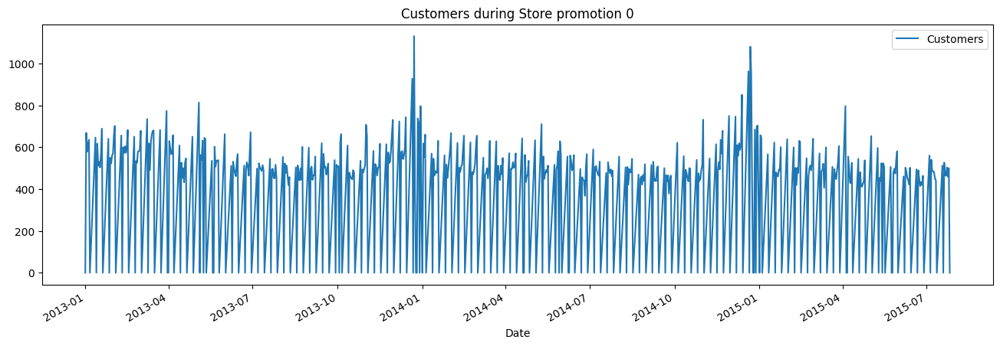

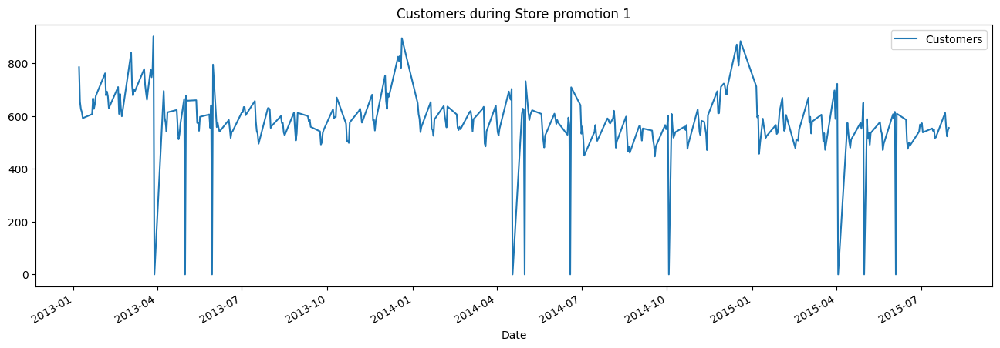

In [ ]:
# Customers during Store promotion
for i in sorted(df['Promo'].unique()):
  df[df.Promo == i].plot(x="Date",y='Customers',figsize = (16,5))
  plt.title('Customers during Store promotion '+str(i))

  plt.show(block=False)
  # 0 Store didn't had the promotion
  # 1 Store had the promotion

In [ ]:
# Group by 'DayOfWeek' mean customers
sales_during_promo = df.groupby('Promo')['Sales'].mean()
sales_during_promo

Promo
0    3198.994845
1    5152.886111
Name: Sales, dtype: float64

In [ ]:
# Group by 'DayOfWeek' mean customers
cust_during_promo = df.groupby('Promo')['Customers'].mean()
cust_during_promo

Promo
0    399.682131
1    577.522222
Name: Customers, dtype: float64

In [ ]:
 (7249.829444-3834.572165)/ 3834.572165*100

89.064884739234

In [ ]:
 (821.646111-501.225773)/ 501.225773*100

63.92734676873849

Observations : We see the 89% increase in sales and 63% in customers on store promotions days

In [ ]:
# In our previous EDA we had infered the highly correlated columns to Sales now we will look to remaining features of the dataframe

In [ ]:
cat_cols

['StateHoliday', 'StoreType', 'Assortment']

In [ ]:
# mappings values
map_values = {'0':0, 'a':1, 'b':2, 'c':3, 'd':4}
df.StateHoliday.replace(map_values, inplace=True)
df.StoreType.replace(map_values, inplace=True)
df.Assortment.replace(map_values, inplace=True)
df.PromoInterval.replace(map_values, inplace=True)
df.head()


# StateHoliday - indicates a state holiday. Normally all stores, with few exceptions, are closed on state holidays. Note that all schools are closed on public holidays and weekends. a = public holiday, b = Easter holiday, c = Christmas, 0 = None
# StoreType - differentiates between 4 different store models: a, b, c, d
# Assortment - describes an assortment level: a = basic, b = extra, c = extended
# PromoInterval - describes the consecutive intervals Promo2 is started, naming the months the promotion is started anew. E.g. "Feb, May, Aug, Nov" means each round starts in February, May, August, November of any given year for that store

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
1,1,4,2015-07-30,5020,546,1,1,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
2,1,3,2015-07-29,4782,523,1,1,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
3,1,2,2015-07-28,5011,560,1,1,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
4,1,1,2015-07-27,6102,612,1,1,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0


In [ ]:
import copy
df_new = copy.deepcopy(df)

In [ ]:
df_new.head(30)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
1,1,4,2015-07-30,5020,546,1,1,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
2,1,3,2015-07-29,4782,523,1,1,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
3,1,2,2015-07-28,5011,560,1,1,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
4,1,1,2015-07-27,6102,612,1,1,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
5,1,7,2015-07-26,0,0,0,0,0,0,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
6,1,6,2015-07-25,4364,500,1,0,0,0,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
7,1,5,2015-07-24,3706,459,1,0,0,0,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
8,1,4,2015-07-23,3769,503,1,0,0,0,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
9,1,3,2015-07-22,3464,463,1,0,0,0,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0


In [ ]:
df['Date'] = pd.to_datetime(df['Date'])

In [ ]:
df = df.sort_values(by='Date', ascending=True)

In [ ]:
df.set_index(df['Date'], inplace=True)

In [ ]:
df.isna().sum()

Store                        0
DayOfWeek                    0
Date                         0
Sales                        0
Customers                    0
Open                         0
Promo                        0
StateHoliday                 0
SchoolHoliday                0
StoreType                    0
Assortment                   0
CompetitionDistance          0
CompetitionOpenSinceMonth    0
CompetitionOpenSinceYear     0
Promo2                       0
Promo2SinceWeek              0
Promo2SinceYear              0
PromoInterval                0
dtype: int64

In [ ]:
df.head(30)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
Date,,,,,,,,,,,,,,,,,,
2013-01-01,1,2,2013-01-01,0,0,0,0,1,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
2013-01-02,1,3,2013-01-02,5530,668,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
2013-01-03,1,4,2013-01-03,4327,578,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
2013-01-04,1,5,2013-01-04,4486,619,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
2013-01-05,1,6,2013-01-05,4997,635,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
2013-01-06,1,7,2013-01-06,0,0,0,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
2013-01-07,1,1,2013-01-07,7176,785,1,1,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
2013-01-08,1,2,2013-01-08,5580,654,1,1,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0
2013-01-09,1,3,2013-01-09,5471,626,1,1,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0


In [ ]:
df.shape

(942, 18)

In [ ]:
# closed stores won't generate sales, so we will remove this part of the dataset

df = df.drop(df[df['Open'] == 0].index, axis=0)

In [ ]:
df.shape

(781, 18)

In [ ]:
df['Sales per Customer'] = df['Sales']/df['Customers']
df['Sales per Customer'].head()

Date
2013-01-02    8.278443
2013-01-03    7.486159
2013-01-04    7.247173
2013-01-05    7.869291
2013-01-07    9.141401
Name: Sales per Customer, dtype: float64

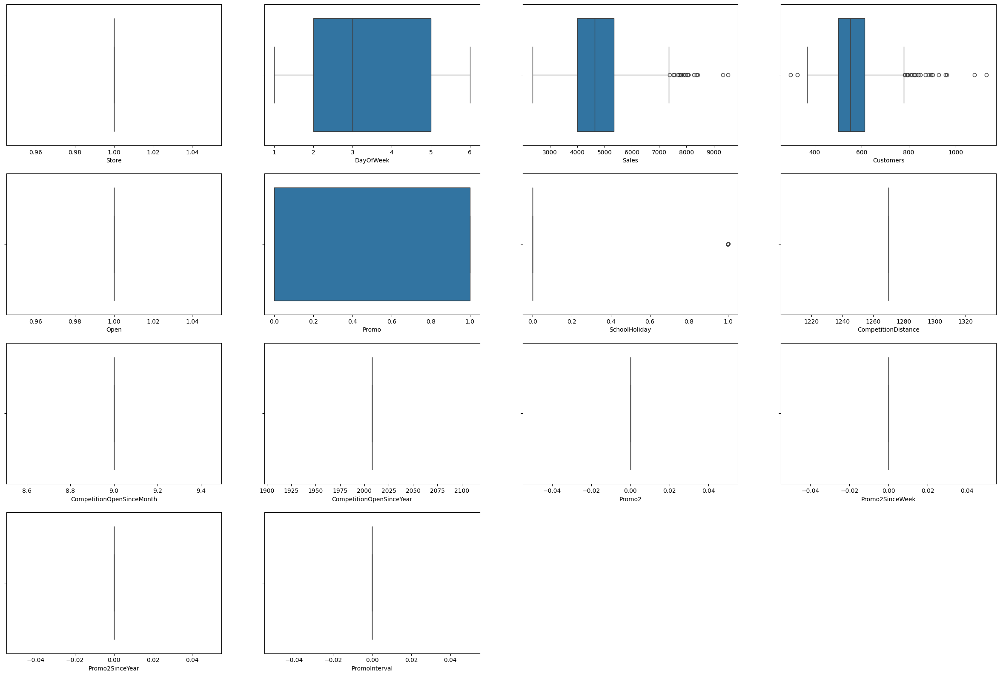

In [ ]:
plt.figure(figsize = [30,25])
feature = num_cols
for i in enumerate(feature):
    plt.subplot(5,4,i[0]+1)
    sns.boxplot(x=df[i[1]])

In [ ]:
df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,Sales per Customer
Date,,,,,,,,,,,,,,,,,,,
2013-01-02,1,3,2013-01-02,5530,668,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,8.278443
2013-01-03,1,4,2013-01-03,4327,578,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,7.486159
2013-01-04,1,5,2013-01-04,4486,619,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,7.247173
2013-01-05,1,6,2013-01-05,4997,635,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,7.869291
2013-01-07,1,1,2013-01-07,7176,785,1,1,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,9.141401


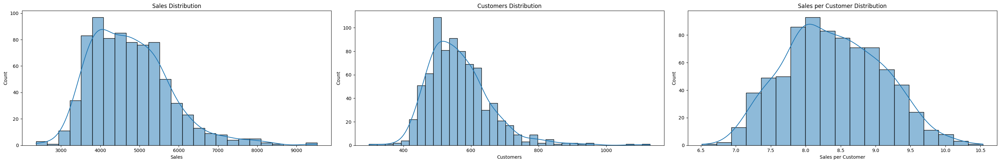

In [ ]:
# Select the columns of interest
plot_cols = df[['Sales', 'Customers', 'Sales per Customer']]

# Set up the figure and axes
plt.figure(figsize=[30, 5])

# Iterate over each column and plot its distribution
for i, column in enumerate(plot_cols.columns):
    plt.subplot(1, 3, i + 1)
    sns.histplot(plot_cols[column], kde=True)
    plt.title(column + ' Distribution')

plt.tight_layout()
plt.show()

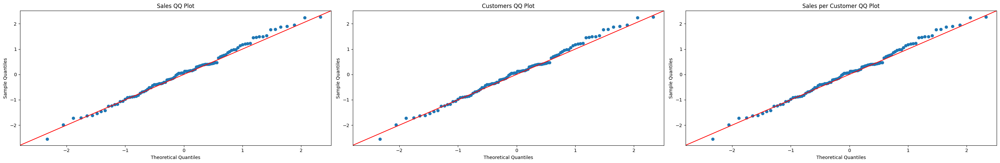

In [ ]:
# Select the columns of interest
plot_cols = df[['Sales', 'Customers', 'Sales per Customer']]

# Set up the figure and axes
plt.figure(figsize=[30, 5])

# Iterate over each column and plot its QQ plot
for i, column in enumerate(plot_cols.columns):
    plt.subplot(1, 3, i + 1)

    # Generate some sample data
    np.random.seed(0)
    data = np.random.normal(loc=0, scale=1, size=100)

    # Create a Normal QQ plot
    sm.qqplot(data, line='45', ax=plt.gca())
    plt.title(column + ' QQ Plot')

plt.tight_layout()
plt.show()

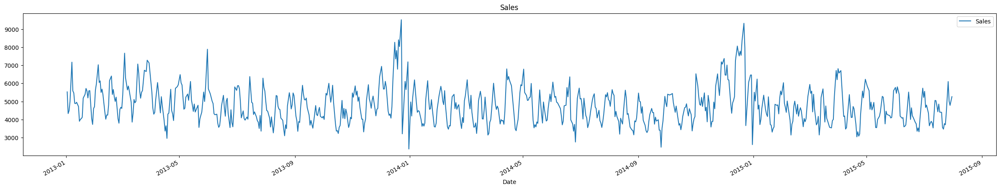

In [ ]:
# Sales for Stores

df.plot(y='Sales',figsize = (30,5))
plt.title('Sales')

plt.show(block=False)

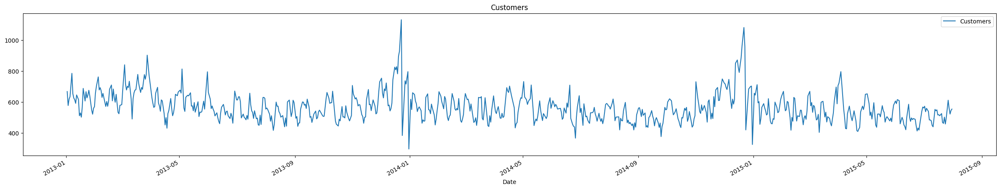

In [ ]:
# Customers on Stores

df.plot(y='Customers',figsize = (30,5))
plt.title('Customers')

plt.show(block=False)

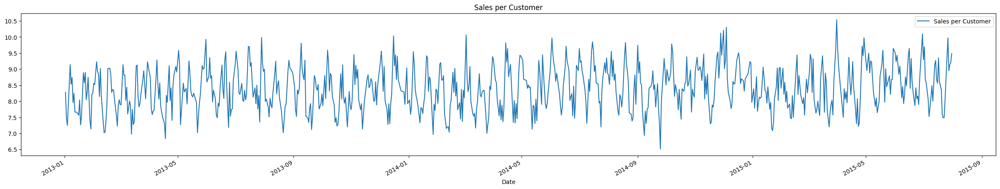

In [ ]:
# Sales per Customer

df.plot(y='Sales per Customer',figsize = (30,5))
plt.title('Sales per Customer')

plt.show(block=False)

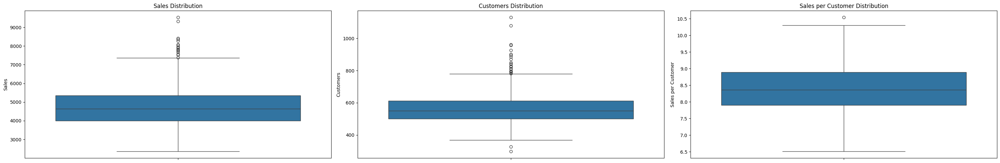

In [ ]:
# Select the columns of interest
plot_cols = df[['Sales', 'Customers', 'Sales per Customer']]

# Set up the figure and axes
plt.figure(figsize=[30, 5])

# Iterate over each column and plot its boxplot
for i, column in enumerate(plot_cols.columns):
    plt.subplot(1, 3, i + 1)
    sns.boxplot(plot_cols[column])
    plt.title(column + ' Distribution')

plt.tight_layout()
plt.show()

Note  : Dropping the rows on any of the above plot would require a bussiness decision

In [ ]:
df['Sales'].describe(percentiles=[0,0.01,0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.97, 0.99 ])

count     781.000000
mean     4759.096031
std      1012.106393
min      2362.000000
0%       2362.000000
1%       3128.000000
5%       3430.000000
10%      3593.000000
25%      4000.000000
50%      4647.000000
75%      5348.000000
90%      6008.000000
97%      7069.600000
99%      7906.200000
max      9528.000000
Name: Sales, dtype: float64

In [ ]:
df['Customers'].describe(percentiles=[0,0.01,0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.97, 0.99])

count     781.000000
mean      564.049936
std        93.707476
min       298.000000
0%        298.000000
1%        415.600000
5%        446.000000
10%       464.000000
25%       500.000000
50%       550.000000
75%       612.000000
90%       678.000000
97%       778.600000
99%       873.600000
max      1130.000000
Name: Customers, dtype: float64

In [ ]:
df['Sales per Customer'].describe(percentiles=[0,0.01,0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.97, 0.99])

count    781.000000
mean       8.393038
std        0.689619
min        6.513228
0%         6.513228
1%         7.020271
5%         7.309572
10%        7.492395
25%        7.903475
50%        8.362376
75%        8.891304
90%        9.296846
97%        9.644226
99%        9.976100
max       10.536503
Name: Sales per Customer, dtype: float64

In [ ]:
df.shape

(781, 19)

In [ ]:
# Capping the extreme values of the graph with new graph ranges betwween quantiles 1% to 99%

# Define the columns for capping
columns_to_cap = ['Sales', 'Customers', 'Sales per Customer']

# Loop through the columns and cap outliers
for column in columns_to_cap:
    lower_percentile, upper_percentile = df[column].quantile([0.01, 0.99])
    df[column] = df[column].clip(lower=lower_percentile, upper=upper_percentile)

In [ ]:
df.shape

(781, 19)

In [ ]:
df.isna().sum()

Store                        0
DayOfWeek                    0
Date                         0
Sales                        0
Customers                    0
Open                         0
Promo                        0
StateHoliday                 0
SchoolHoliday                0
StoreType                    0
Assortment                   0
CompetitionDistance          0
CompetitionOpenSinceMonth    0
CompetitionOpenSinceYear     0
Promo2                       0
Promo2SinceWeek              0
Promo2SinceYear              0
PromoInterval                0
Sales per Customer           0
dtype: int64

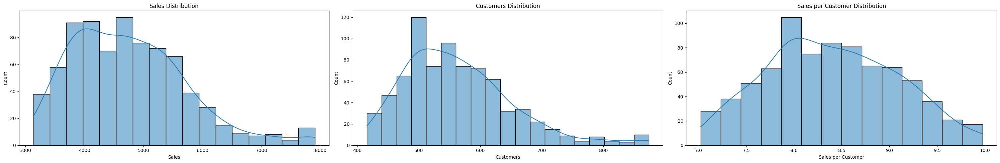

In [ ]:
# Select the columns of interest
plot_cols = df[['Sales', 'Customers', 'Sales per Customer']]

# Set up the figure and axes
plt.figure(figsize=[30, 5])

# Iterate over each column and plot its distribution
for i, column in enumerate(plot_cols.columns):
    plt.subplot(1, 3, i + 1)
    sns.histplot(plot_cols[column], kde=True)
    plt.title(column + ' Distribution')

plt.tight_layout()
plt.show()

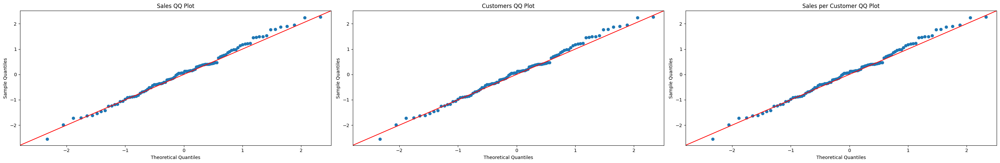

In [ ]:
# Select the columns of interest
plot_cols = df[['Sales', 'Customers', 'Sales per Customer']]

# Set up the figure and axes
plt.figure(figsize=[30, 5])

# Iterate over each column and plot its QQ plot
for i, column in enumerate(plot_cols.columns):
    plt.subplot(1, 3, i + 1)

    # Generate some sample data
    np.random.seed(0)
    data = np.random.normal(loc=0, scale=1, size=100)

    # Create a Normal QQ plot
    sm.qqplot(data, line='45', ax=plt.gca())
    plt.title(column + ' QQ Plot')

plt.tight_layout()
plt.show()

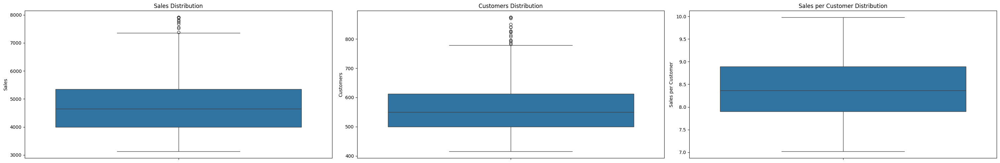

In [ ]:
# Select the columns of interest
plot_cols = df[['Sales', 'Customers', 'Sales per Customer']]

# Set up the figure and axes
plt.figure(figsize=[30, 5])

# Iterate over each column and plot its boxplot
for i, column in enumerate(plot_cols.columns):
    plt.subplot(1, 3, i + 1)
    sns.boxplot(plot_cols[column])
    plt.title(column + ' Distribution')

plt.tight_layout()
plt.show()

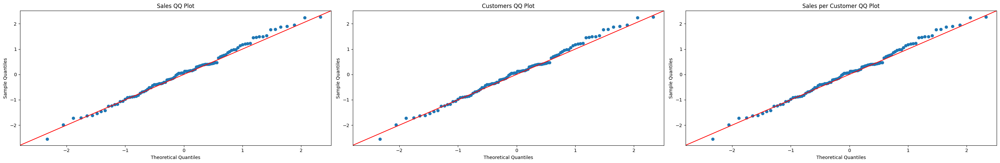

In [ ]:
# Select the columns of interest
plot_cols = df[['Sales', 'Customers', 'Sales per Customer']]

# Set up the figure and axes
plt.figure(figsize=[30, 5])

# Iterate over each column and plot its QQ plot
for i, column in enumerate(plot_cols.columns):
    plt.subplot(1, 3, i + 1)

    # Generate some sample data
    np.random.seed(0)
    data = np.random.normal(loc=0, scale=1, size=100)

    # Create a Normal QQ plot
    sm.qqplot(data, line='45', ax=plt.gca())
    plt.title(column + ' QQ Plot')

plt.tight_layout()
plt.show()

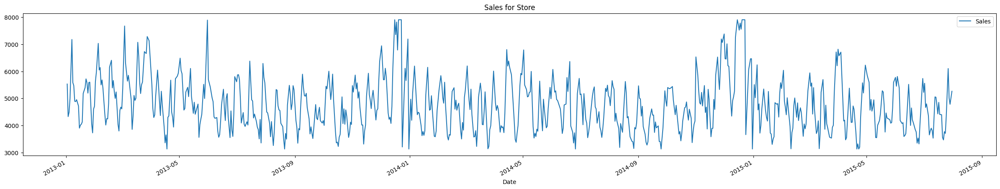

In [ ]:
# Sales for Stores
df.plot(y='Sales',figsize = (30,5))
plt.title('Sales for Store')

plt.show(block=False)

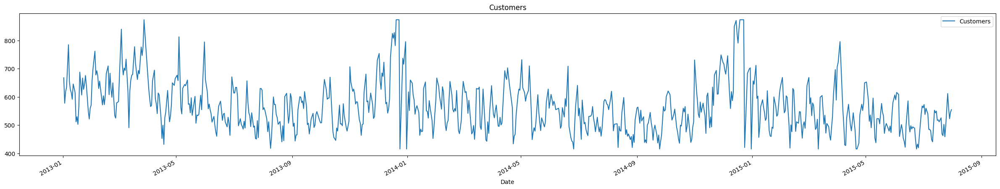

In [ ]:
# Sales for Stores
df.plot(y='Customers',figsize = (30,5))
plt.title('Customers')

plt.show(block=False)

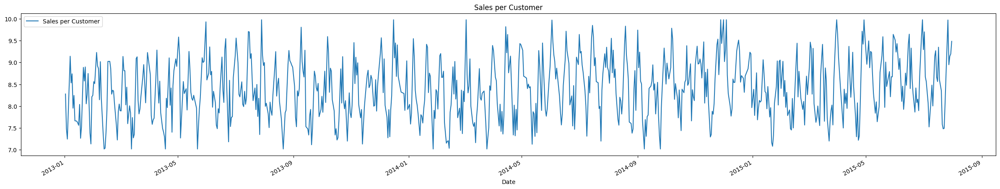

In [ ]:
# Sales for Stores
df.plot(y='Sales per Customer',figsize = (30,5))
plt.title('Sales per Customer')

plt.show(block=False)

In [ ]:
# Additive Sales

def plot_timeseries_data(data):
    print('Decomposition')

    rcParams['figure.figsize'] = 25, 10
    decom = sm.tsa.seasonal_decompose(data, model="additive", period=25)  # monthly interval
    decom.plot()

    plt.show(block=False)
    print('\n')
    print('\n')


Decomposition


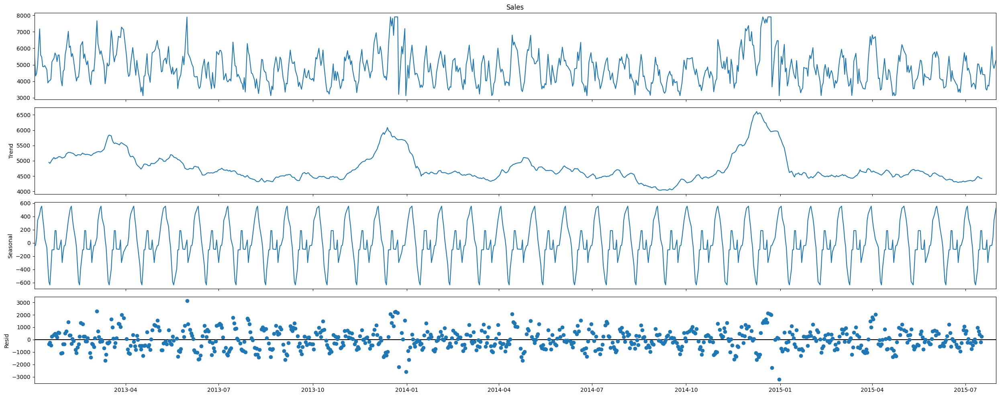

In [ ]:
# Additive sales

plot_timeseries_data(df['Sales'])

Decomposition


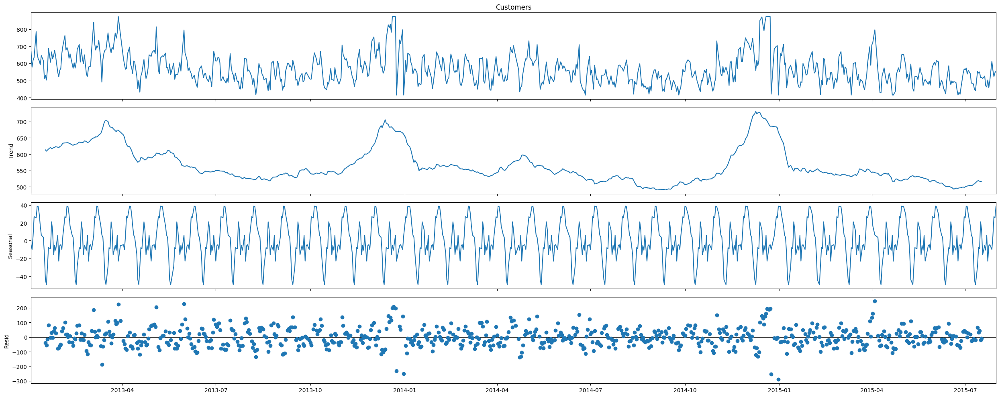

In [ ]:
# Additive Customers

plot_timeseries_data(df['Customers'])

Decomposition


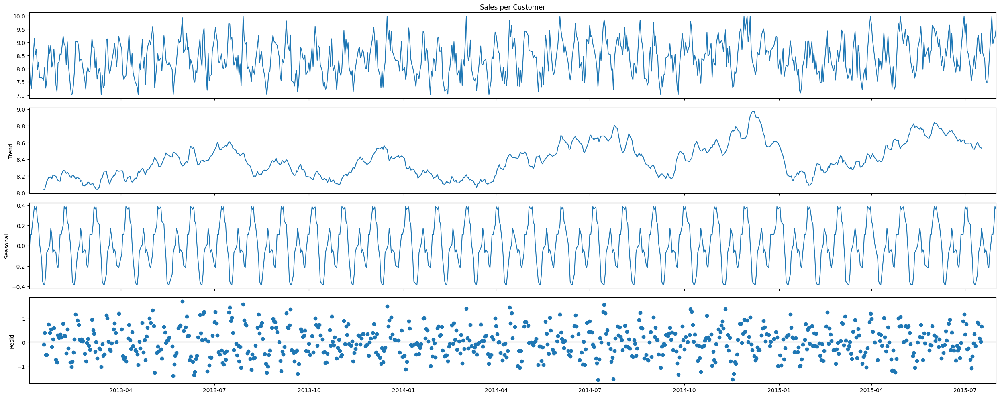

In [ ]:
# Additive Sales per Customer

plot_timeseries_data(df['Sales per Customer'])

Gaussian Transformation

1. Log Tranformation

In [ ]:
df['logged_Sales'] = np.log(df['Sales'])
df['logged_Customers'] = np.log(df['Customers'])
df['logged_Sales per Customer'] = np.log(df['Sales per Customer'])

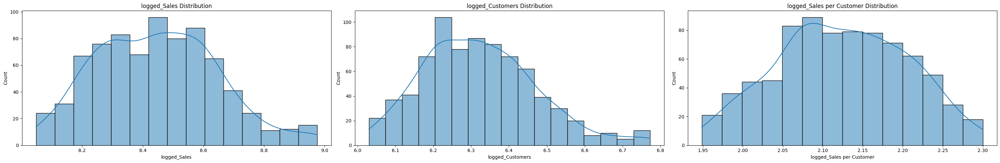

In [ ]:
# Select the columns of interest
plot_cols = df[['logged_Sales', 'logged_Customers', 'logged_Sales per Customer']]

# Set up the figure and axes
plt.figure(figsize=[30, 5])

# Iterate over each column and plot its distribution
for i, column in enumerate(plot_cols.columns):
    plt.subplot(1, 3, i + 1)
    sns.histplot(plot_cols[column], kde=True)
    plt.title(column + ' Distribution')

plt.tight_layout()
plt.show()

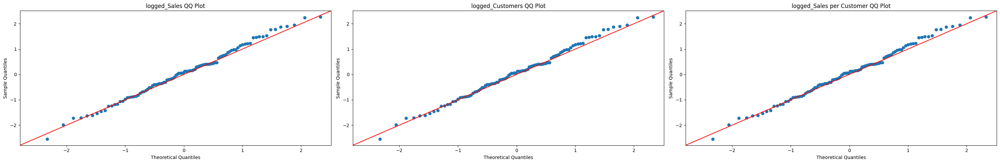

In [ ]:
# Select the columns of interest
plot_cols = df[['logged_Sales', 'logged_Customers', 'logged_Sales per Customer']]

# Set up the figure and axes
plt.figure(figsize=[30, 5])

# Iterate over each column and plot its QQ plot
for i, column in enumerate(plot_cols.columns):
    plt.subplot(1, 3, i + 1)

    # Generate some sample data
    np.random.seed(0)
    data = np.random.normal(loc=0, scale=1, size=100)

    # Create a Normal QQ plot
    sm.qqplot(data, line='45', ax=plt.gca())
    plt.title(column + ' QQ Plot')

plt.tight_layout()
plt.show()

2. Box-Cox Tranformation

In [ ]:
from scipy.stats import boxcox

shift_const = 0.01
df['Shifted_Sales'] = df['Sales'] + shift_const
df['Shifted_Customers'] = df['Customers'] + shift_const
df['Shifted_Sales per Customer'] = df['Sales per Customer'] + shift_const

# Apply Box-Cox transformation to the shifted data
df['BoxCox_Sales'], lambda_sales = boxcox(df['Shifted_Sales'])
df['BoxCox_Customers'], lambda_customers = boxcox(df['Shifted_Customers'])
df['BoxCox_Sales per Customer'], lambda_sales_per_customer = boxcox(df['Shifted_Sales per Customer'])

# Optionally, you can print the lambda values to understand the transformation applied
print("Lambda Value for Sales:", lambda_sales)
print("Lambda Value for Customers:", lambda_customers)
print("Lambda Value for Sales per Customer:", lambda_sales_per_customer)

Lambda Value for Sales: -0.5660608191083856
Lambda Value for Customers: -1.251187353094612
Lambda Value for Sales per Customer: 0.04618149458236618


In [ ]:
# Drop the shifted columns if they are no longer needed
df.drop(['Shifted_Sales', 'Shifted_Customers', 'Shifted_Sales per Customer'], axis=1, inplace=True)

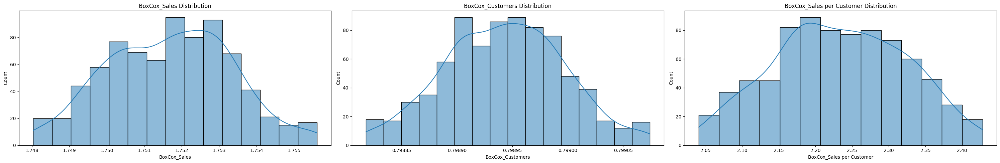

In [ ]:
# Select the columns of interest
plot_cols = df[['BoxCox_Sales', 'BoxCox_Customers', 'BoxCox_Sales per Customer']]

# Set up the figure and axes
plt.figure(figsize=[30, 5])

# Iterate over each column and plot its distribution
for i, column in enumerate(plot_cols.columns):
    plt.subplot(1, 3, i + 1)
    sns.histplot(plot_cols[column], kde=True)
    plt.title(column + ' Distribution')

plt.tight_layout()
plt.show()

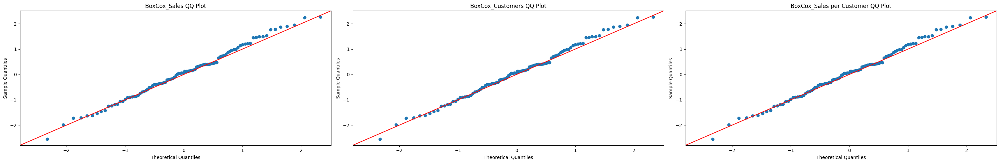

In [ ]:
# Select the columns of interest
plot_cols = df[['BoxCox_Sales', 'BoxCox_Customers', 'BoxCox_Sales per Customer']]

# Set up the figure and axes
plt.figure(figsize=[30, 5])

# Iterate over each column and plot its QQ plot
for i, column in enumerate(plot_cols.columns):
    plt.subplot(1, 3, i + 1)

    # Generate some sample data
    np.random.seed(0)
    data = np.random.normal(loc=0, scale=1, size=100)

    # Create a Normal QQ plot
    sm.qqplot(data, line='45', ax=plt.gca())
    plt.title(column + ' QQ Plot')

plt.tight_layout()
plt.show()

1.3 Z score transformation

In [ ]:
# Define the columns to be standardized
columns_to_standardize = ['Sales', 'Customers', 'Sales per Customer']

# Create new columns for standardized values
for column in columns_to_standardize:
    new_column_name = column + '_standardized'  # Create a new column name
    mean = df[column].mean()
    std = df[column].std()
    df[new_column_name] = (df[column] - mean) / std  # Standardize the column values and store them in the new column

# Optionally, you can print the first few rows of the DataFrame to verify the new columns
print(df.head())

            Store  DayOfWeek       Date   Sales  Customers  Open  Promo  StateHoliday  SchoolHoliday  StoreType  Assortment  CompetitionDistance  CompetitionOpenSinceMonth  CompetitionOpenSinceYear  Promo2  Promo2SinceWeek  Promo2SinceYear  PromoInterval  Sales per Customer  logged_Sales  logged_Customers  logged_Sales per Customer  BoxCox_Sales  BoxCox_Customers  BoxCox_Sales per Customer  Sales_standardized  Customers_standardized  Sales per Customer_standardized
Date                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 
2013-01-02      1          3 2013-01-02  5530.0      668.0  

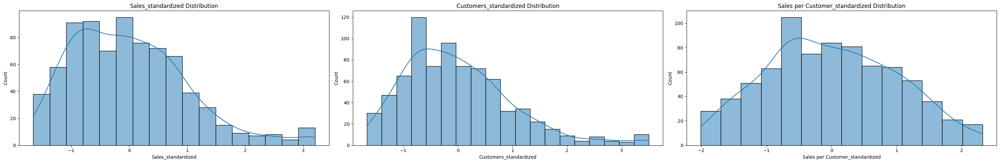

In [ ]:
# Select the columns of interest
plot_cols = df[['Sales_standardized', 'Customers_standardized', 'Sales per Customer_standardized']]

# Set up the figure and axes
plt.figure(figsize=[30, 5])

# Iterate over each column and plot its distribution
for i, column in enumerate(plot_cols.columns):
    plt.subplot(1, 3, i + 1)
    sns.histplot(plot_cols[column], kde=True)
    plt.title(column + ' Distribution')

plt.tight_layout()
plt.show()

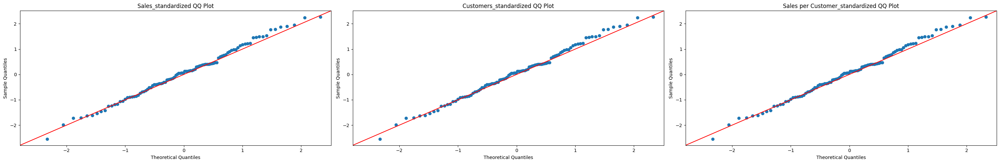

In [ ]:
# Select the columns of interest
plot_cols = df[['Sales_standardized', 'Customers_standardized', 'Sales per Customer_standardized']]

# Set up the figure and axes
plt.figure(figsize=[30, 5])

# Iterate over each column and plot its QQ plot
for i, column in enumerate(plot_cols.columns):
    plt.subplot(1, 3, i + 1)

    # Generate some sample data
    np.random.seed(0)
    data = np.random.normal(loc=0, scale=1, size=100)

    # Create a Normal QQ plot
    sm.qqplot(data, line='45', ax=plt.gca())
    plt.title(column + ' QQ Plot')

plt.tight_layout()
plt.show()

In [ ]:
# from IPython.display import Image, display
# display(Image(filename='TS.png'))

Stats Stationary tests :

1. Augmented Dickey-Fuller (ADF) test :

The ADF test is a statistical test used to assess whether a time series has a unit root, which indicates the presence of a stochastic trend and non-stationarity. The test involves regressing the differenced series on its lagged values and additional lagged differences. The null hypothesis is that a unit root is present, suggesting non-stationarity. A rejection of the null hypothesis provides evidence of stationarity.


* If p-value < 0.05, Null Hypothesis (HO): Series is non-stationary, or series has a unit root.

* If p-value >= 0.05, Alternate Hypothesis(HA): Series is stationary, or series has no unit root.


    ADF test: Low p-value below 0.05 to suggest stationarity.


2. Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test :

The KPSS test is employed to determine whether a time series is stationary around a deterministic trend. It involves testing the null hypothesis that the series is stationary around a deterministic trend against the alternative that it has a unit root and is non-stationary. A higher p-value in the KPSS test suggests that the series is stationary, while a lower p-value supports non-stationarity.

* p-value >= 0.05, Null Hypothesis (HO): Series is trend stationary or series has no unit root.

* p-value < 0.05, Alternate Hypothesis(HA): Series is non-stationary, or series has a unit root.


    KPSS test: High p-value above 0.05 to suggest stationarity.




Augmented Dickey-Fuller (ADF) tests : Sales, Customers, Sales per Customer

In [ ]:
# Augmented Dickey-Fuller (ADF) test function:

from statsmodels.tsa.stattools import adfuller, kpss

def adf_test(series, significance_level=0.05):

    result = adfuller(series, autolag='AIC')
    p_value = result[1]

    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {p_value}')
    print(f'Significance Level: {significance_level}')

    if p_value <= significance_level:
        print("Null hypothesis (unit root) rejected. Series is stationary.")
    else:
        print("Failed to reject the null hypothesis. Series may not be stationary.")

    return result

In [ ]:
# Performing the ADF test based on Sales

sales = df['Sales']
print("ADF test results for Sales")

adf_test(sales)
print("\n")

ADF test results for Sales
ADF Statistic: -5.437178600026745
p-value: 2.8285116592886813e-06
Significance Level: 0.05
Null hypothesis (unit root) rejected. Series is stationary.




Observation:
We see the p values in scientific notation.

In [ ]:
# Performing the ADF test based on Customers

customers = df['Customers']
print("ADF test results for Customers")

adf_test(customers)
print("\n")

ADF test results for Customers
ADF Statistic: -4.277482813472507
p-value: 0.00048583140968915683
Significance Level: 0.05
Null hypothesis (unit root) rejected. Series is stationary.




In [ ]:
# Performing the ADF test based on Sales per Customers

sale_per_cust = df['Customers']
print("ADF test results for Customers")

adf_test(sale_per_cust)
print("\n")

ADF test results for Customers
ADF Statistic: -4.277482813472507
p-value: 0.00048583140968915683
Significance Level: 0.05
Null hypothesis (unit root) rejected. Series is stationary.




Observation : The above ADF tests proves us that our features "Sales, Customer and Sales per Customer" have stationary series values, which means there is no trend or seasonality effecting the series which will be ideal to implement the ARIMA family models

In [ ]:
def kpss_test(series, significance_level=0.05):
    result = kpss(series, regression='c', nlags='legacy', store=True)
    p_value = result[1]

    print(f'KPSS Statistic: {result[0]}')
    print(f'p-value: {p_value}')
    print(f'Significance Level: {significance_level}')

    if p_value >= significance_level:
        print("Series is stationary around a trend")
    else:
        print("Failed to reject the null hypothesis. Series is not stationary around a trend")

    return result

In [ ]:
# Performing the KPSS test based on Sales

sales_kpss = df['Sales']
print("KPSS test results for Store")

kpss_test(sales_kpss)
print("\n")

KPSS test results for Store
KPSS Statistic: 0.24483255629930276
p-value: 0.1
Significance Level: 0.05
Series is stationary around a trend




In [ ]:
# Performing the KPSS test based on Customers

cust_kpss = df['Customers']
print("KPSS test results for Customers")

kpss_test(cust_kpss)
print("\n")

KPSS test results for Customers
KPSS Statistic: 0.6016660192255358
p-value: 0.02248490734313311
Significance Level: 0.05
Failed to reject the null hypothesis. Series is not stationary around a trend




In [ ]:
# Performing the KPSS test based on Sales per Customer

sal_per_cust_kpss = df['Sales per Customer']
print("KPSS test results for Customers")

kpss_test(sal_per_cust_kpss)
print("\n")

KPSS test results for Customers
KPSS Statistic: 1.066058570445933
p-value: 0.01
Significance Level: 0.05
Failed to reject the null hypothesis. Series is not stationary around a trend




In [ ]:
# Applying differencing

# Perform differencing
df["Customers_diff1"] = df['Customers'].diff(1)
df["Sales per Customer_diff1"] = df['Sales per Customer'].diff(1)

In [ ]:
cust_dff1 = df["Customers_diff1"].dropna()
sal_cust_dff1 = df["Sales per Customer_diff1"].dropna()

In [ ]:
cust_dff1.head(2)

Date
2013-01-03   -90.0
2013-01-04    41.0
Name: Customers_diff1, dtype: float64

In [ ]:
sal_cust_dff1.head(2)

Date
2013-01-03   -0.792284
2013-01-04   -0.238986
Name: Sales per Customer_diff1, dtype: float64

In [ ]:
# Performing the KPSS test

print("KPSS test result")
kpss_test(cust_dff1)

print("\nKPSS test results")
kpss_test(sal_cust_dff1)

KPSS test result
KPSS Statistic: 0.02296107312792797
p-value: 0.1
Significance Level: 0.05
Series is stationary around a trend

KPSS test results
KPSS Statistic: 0.026408461921386617
p-value: 0.1
Significance Level: 0.05
Series is stationary around a trend


(0.026408461921386617,
 0.1,
 {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739},
 <statsmodels.stats.diagnostic.ResultsStore at 0x7aef03e65090>)

Observations : The p value is significants for all 3 features within 1 differentiation

In [ ]:
# model with 6 weeks forecast would be 30 days with 5 offs om Sunday

train_store_1 = df.iloc[:-30]
test_store_1 = df.iloc[-30:]
train_store_1.shape, test_store_1.shape

((751, 30), (30, 30))

In [ ]:
train_store_1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,Sales per Customer,logged_Sales,logged_Customers,logged_Sales per Customer,BoxCox_Sales,BoxCox_Customers,BoxCox_Sales per Customer,Sales_standardized,Customers_standardized,Sales per Customer_standardized,Customers_diff1,Sales per Customer_diff1
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-02,1,3,2013-01-02,5530.0,668.0,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,8.278443,8.617943,6.504288,2.113655,1.753151,0.799007,2.221585,0.786963,1.178350,-0.166831,NaN,NaN
2013-01-03,1,4,2013-01-03,4327.0,578.0,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,7.486159,8.372630,6.359574,2.013056,1.751148,0.798961,2.111062,-0.436923,0.163253,-1.328517,-90.0,-0.792284
2013-01-04,1,5,2013-01-04,4486.0,619.0,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,7.247173,8.408717,6.428105,1.980611,1.751460,0.798984,2.075529,-0.275163,0.625686,-1.678931,41.0,-0.238986
2013-01-05,1,6,2013-01-05,4997.0,635.0,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,7.869291,8.516593,6.453625,2.062968,1.752357,0.798992,2.165832,0.244709,0.806148,-0.766749,16.0,0.622118
2013-01-07,1,1,2013-01-07,7176.0,785.0,1,1,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,9.141401,8.878497,6.665684,2.212814,1.754994,0.799050,2.331041,2.461541,2.497976,1.098482,150.0,1.272110


In [ ]:
train_store_1.index

DatetimeIndex(['2013-01-02', '2013-01-03', '2013-01-04', '2013-01-05', '2013-01-07', '2013-01-08', '2013-01-09', '2013-01-10', '2013-01-11', '2013-01-12',
               ...
               '2015-06-16', '2015-06-17', '2015-06-18', '2015-06-19', '2015-06-20', '2015-06-22', '2015-06-23', '2015-06-24', '2015-06-25', '2015-06-26'], dtype='datetime64[ns]', name='Date', length=751, freq=None)

In [ ]:
test_store_1.index

DatetimeIndex(['2015-06-27', '2015-06-29', '2015-06-30', '2015-07-01', '2015-07-02', '2015-07-03', '2015-07-04', '2015-07-06', '2015-07-07', '2015-07-08', '2015-07-09', '2015-07-10', '2015-07-11', '2015-07-13', '2015-07-14', '2015-07-15', '2015-07-16', '2015-07-17', '2015-07-18', '2015-07-20', '2015-07-21', '2015-07-22', '2015-07-23', '2015-07-24', '2015-07-25', '2015-07-27', '2015-07-28', '2015-07-29', '2015-07-30', '2015-07-31'], dtype='datetime64[ns]', name='Date', freq=None)

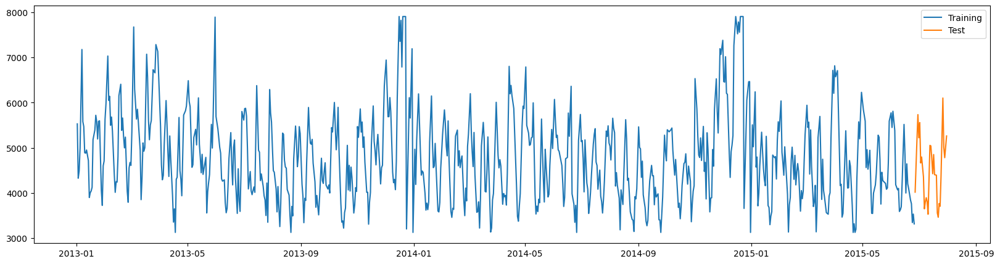

In [ ]:
plt.figure(figsize=(20,5))
plt.plot(train_store_1.index, train_store_1['Sales'], label="Training")
plt.plot(test_store_1.index, test_store_1['Sales'], label="Test")
plt.legend()
plt.show()

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf


def Plot_Acf_Pacf(data):
    print('\033[1m PACF AND ACF for Store:', '\033[0m')

    # Create a figure with larger figsize
    plt.subplots(figsize=(30, 8))

    # Plot ACF
    plt.subplot(1,2,1)
    lag_acf = plot_acf(data, ax=plt.gca(), lags=30)
    plt.title('Autocorrelation Function')

    # Plot PACF
    plt.subplot(1,2,2)
    lag_pacf = plot_pacf(data, ax=plt.gca(), lags=30)
    plt.title('Partial Autocorrelation Function')

    # Adjust layout for better visualization
    plt.tight_layout()

    # Display the plot
    plt.show()

Notes :

Q - value : Till lag 4 the ACF plot is statistically significant


P - value : Statistically significant range is Highest lag 1 the PACF plot


In [ ]:
import itertools
import statsmodels.api as sm

p_values = [0]
d_values = [0]
q_values = [0]

# P_values = range(0, 3)
# D_values = [0]
# Q_values = range(0, 3)
# s_values = [2,7, 6, 12]

best_aic = float("inf")
best_order = None
best_seasonal_order = None

for p, d, q in itertools.product(p_values, d_values, q_values):
#  P_values, D_values, Q_values, s_values
# P, D, Q, s
    order = (p, d, q)
    # seasonal_order = (P, D, Q, s)
    try:
        model = sm.tsa.statespace.SARIMAX(train_store_1['Sales'], order=order)
        results = model.fit(disp=False)
        aic = results.aic
        if aic < best_aic:
            best_aic = aic
            best_order = order
            # best_seasonal_order = seasonal_order
    except Exception as e:
        print(f"Error for order {order} and seasonal order: {e}")

print(f'Best AIC: {best_aic}')
print(f'Best Order: {best_order}')

Best AIC: 14885.587430946014
Best Order: (0, 0, 0)


Store ID: 1, Sales Data Forecast

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error

def sarima_forecast(train_df, test_df, order, seasonal_order, exog_train, exog_test):
    # Create a MinMaxScaler instance
    scaler = MinMaxScaler()

    # Fit the scaler on the training data and transform the 'Sales' column
    scaled_df = scaler.fit_transform(train_df.values.reshape(-1, 1))

    # Create a DataFrame with the scaled sales and the corresponding index
    scaled_train_data = pd.DataFrame(data=scaled_df, index=train_df.index, columns=['scaled_df'])

    # Train the SARIMA model with scaled data
    model = SARIMAX(scaled_train_data['scaled_df'], order=order, seasonal_order=seasonal_order, exog=exog_train)
    model_fit = model.fit()

    # Print model summary
    print(model_fit.summary())

    # Diagnostics plot
    fig = model_fit.plot_diagnostics(figsize=(8, 8))
    fig.autofmt_xdate()
    plt.show()

    # Specify the number of forecast steps
    forecast_steps = len(test_df)

    # Get the forecast values and confidence intervals
    forecast = model_fit.get_forecast(steps=forecast_steps, exog=exog_test)
    forecast_values = scaler.inverse_transform(forecast.predicted_mean.values.reshape(-1, 1))
    confidence_intervals = scaler.inverse_transform(forecast.conf_int().values)

    # Plot the original data and the forecast with confidence intervals
    plt.figure(figsize=(35, 10))
    plt.plot(train_df.index, train_df.values, label='Train Data')
    plt.plot(test_df.index, test_df.values, label='Test Data')
    plt.plot(test_df.index, forecast_values, color='red', label='Forecast')
    plt.fill_between(test_df.index, confidence_intervals[:, 0], confidence_intervals[:, 1], color='pink', alpha=0.3, label='Confidence Intervals')
    plt.title('SARIMA Forecast')
    plt.xlabel('Timestamp')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

    # Predicted values and actual values
    predicted_values = forecast_values.flatten()
    actual_values = test_df.values.flatten()

    # Mean Absolute Error (MAE)
    mae = mean_absolute_error(actual_values, predicted_values)
    print("MAE:", mae)

    # Root Mean Squared Error (RMSE)
    rmse = np.sqrt(mean_squared_error(actual_values, predicted_values))
    print("RMSE:", rmse)

    # Mean Absolute Percentage Error (MAPE)
    mape = np.mean(np.abs((actual_values - predicted_values) / actual_values)) * 100
    print("MAPE:", mape)

 PACF AND ACF for Store: 


<Figure size 3000x500 with 0 Axes>

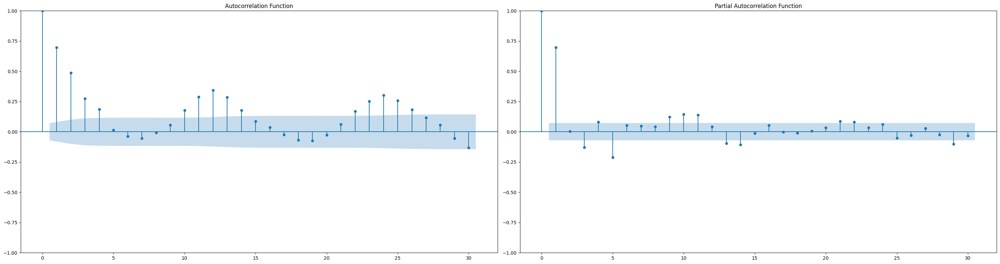

In [ ]:
# Performing the ADF test based on Sales for individual stores(store ids : 1)
plt.figure(figsize=[30, 5])
sales_store_1 = train_store_1['Sales'].dropna()
Plot_Acf_Pacf(sales_store_1)
plt.show()

                                      SARIMAX Results                                       
Dep. Variable:                            scaled_df   No. Observations:                  751
Model:             SARIMAX(0, 0, 4)x(2, 2, [1], 12)   Log Likelihood                 314.470
Date:                              Fri, 15 Mar 2024   AIC                           -610.939
Time:                                      18:04:15   BIC                           -569.639
Sample:                                           0   HQIC                          -595.002
                                              - 751                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Promo          0.1262      0.015      8.513      0.000       0.097       0.155
ma.L1          0.59

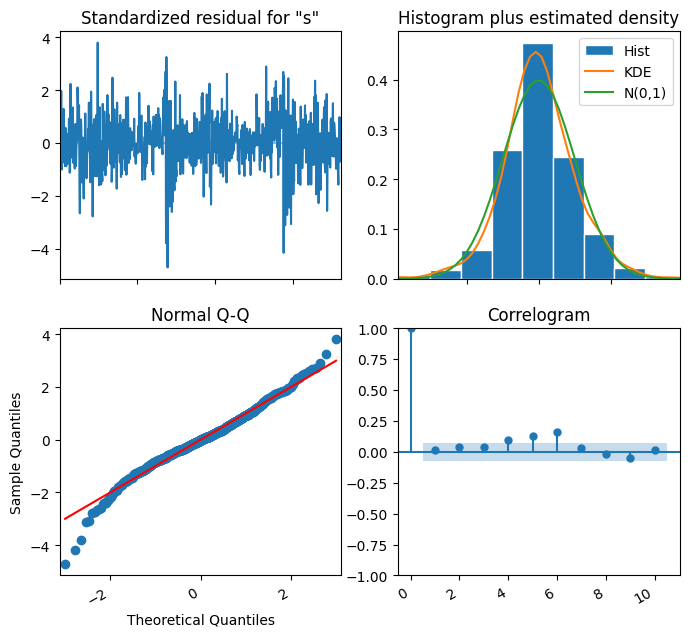

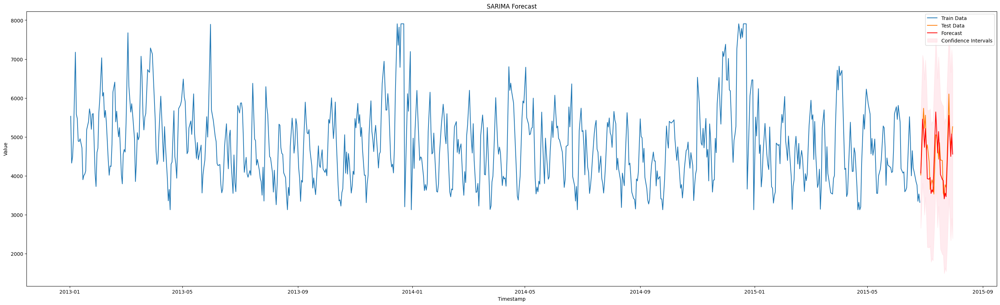

MAE: 339.9268336759864
RMSE: 405.65247329997425
MAPE: 7.502918197903124


In [ ]:
sarima_forecast(train_store_1['Sales'], test_store_1['Sales'],
                order=(0, 0, 4), seasonal_order=(2, 2, 1, 12),
                exog_train=train_store_1[['Promo']],
                exog_test=test_store_1[['Promo']])

                                      SARIMAX Results                                       
Dep. Variable:                            scaled_df   No. Observations:                  751
Model:             SARIMAX(0, 0, 4)x(2, 2, [1], 12)   Log Likelihood                 279.427
Date:                              Fri, 15 Mar 2024   AIC                           -540.853
Time:                                      18:04:59   BIC                           -499.553
Sample:                                           0   HQIC                          -524.916
                                              - 751                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Promo          0.1343      0.016      8.556      0.000       0.104       0.165
ma.L1          0.55

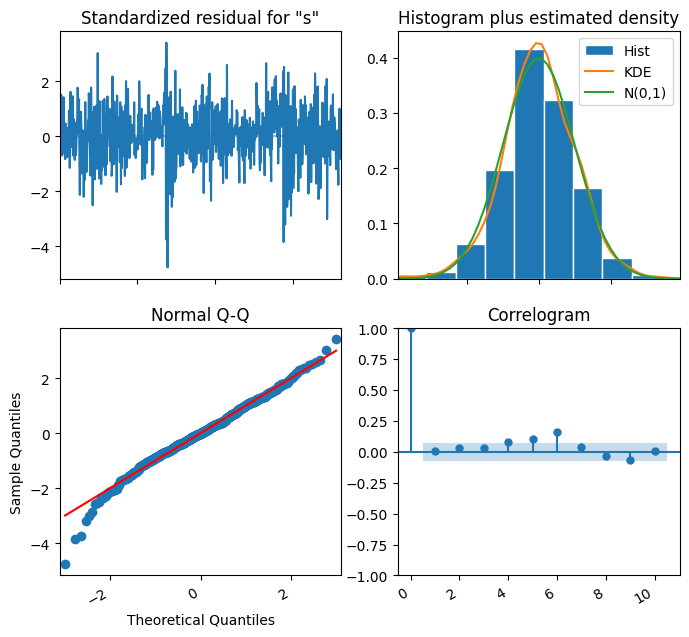

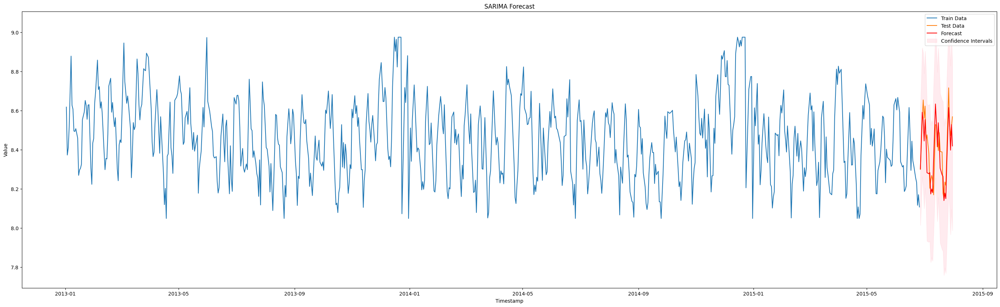

MAE: 0.07617257496449917
RMSE: 0.09045947069435466
MAPE: 0.9055967072187759


In [ ]:
sarima_forecast(train_store_1['logged_Sales'], test_store_1['logged_Sales'],
                order=(0, 0, 4), seasonal_order=(2, 2, 1, 12),
                exog_train=train_store_1[['Promo']],
                exog_test=test_store_1[['Promo']])

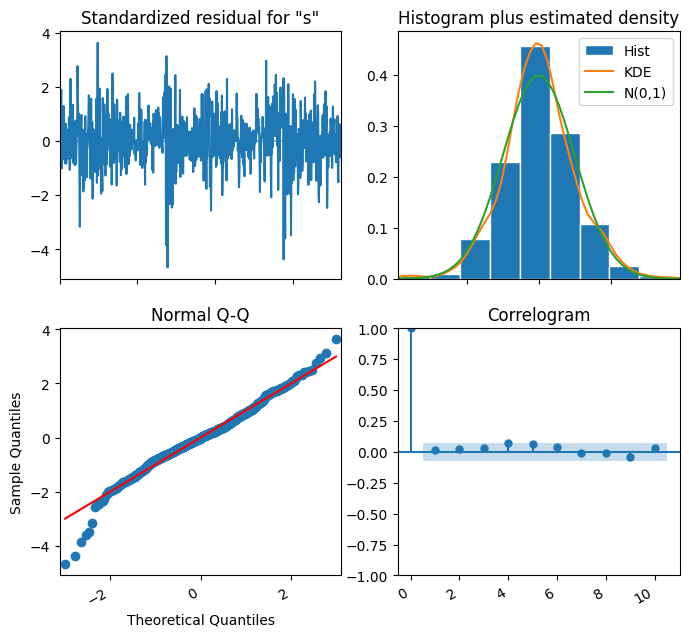

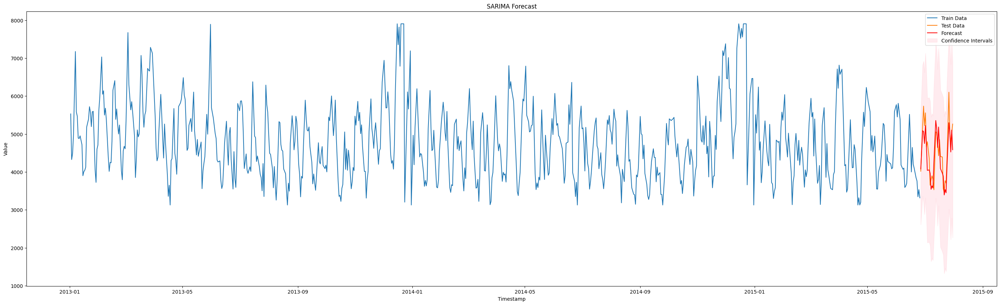

MAE: 323.39763771788637
RMSE: 397.1202930613567
MAPE: 7.132078060048622


In [ ]:
sarima_forecast(train_store_1['Sales'], test_store_1['Sales'],
                order=(0, 0, 4), seasonal_order=(2, 2, 1, 12),
                exog_train=None,
                exog_test=None)

 PACF AND ACF for Store: 


<Figure size 3000x500 with 0 Axes>

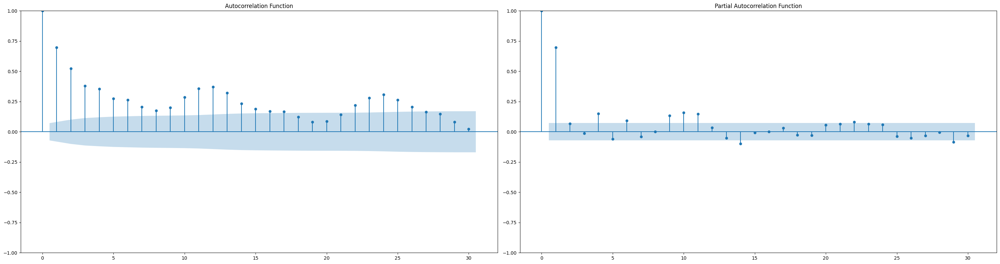

In [ ]:
# Performing the ADF test based on Sales for individual stores(store ids : 1)
plt.figure(figsize=[30, 5])
cust_store_1 = train_store_1['Customers'].dropna()
Plot_Acf_Pacf(cust_store_1)
plt.show()

                                      SARIMAX Results                                       
Dep. Variable:                            scaled_df   No. Observations:                  751
Model:             SARIMAX(0, 1, 8)x(2, 2, [1], 12)   Log Likelihood                 316.681
Date:                              Fri, 15 Mar 2024   AIC                           -609.363
Time:                                      18:06:16   BIC                           -554.312
Sample:                                           0   HQIC                          -588.118
                                              - 751                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.4461      0.042    -10.517      0.000      -0.529      -0.363
ma.L2         -0.16

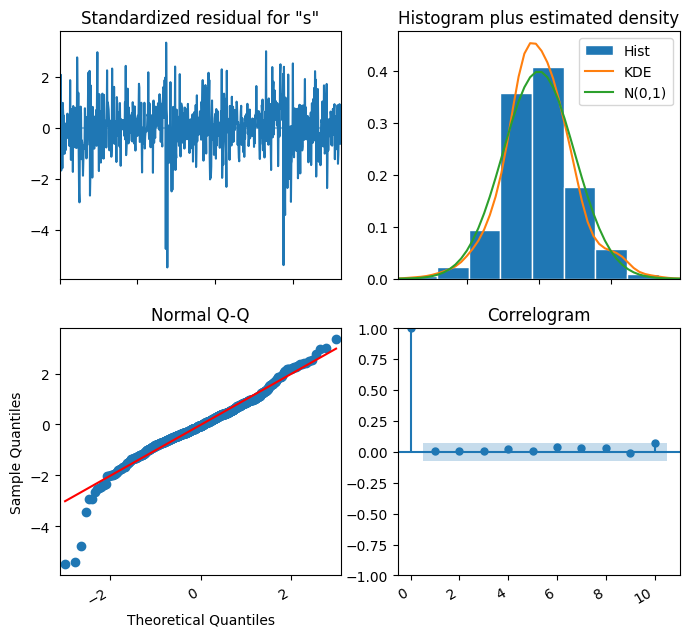

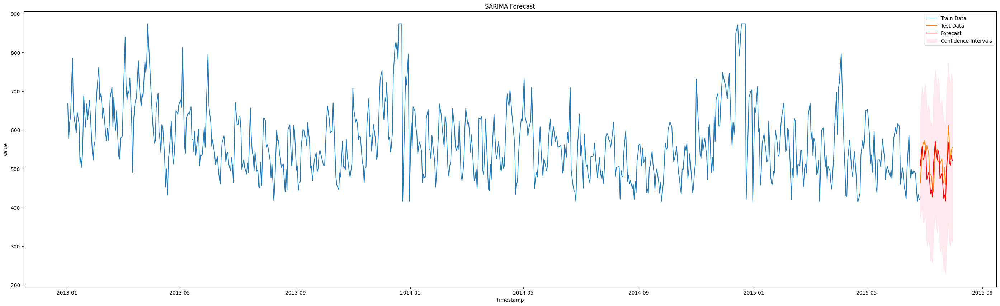

MAE: 32.640935834905974
RMSE: 38.2175198335148
MAPE: 6.341439175406858


In [ ]:
sarima_forecast(train_store_1['Customers'], test_store_1['Customers'],
                order=(0, 1, 8), seasonal_order=(2, 2, 1, 12),
                exog_train=None,
                exog_test=None)

 PACF AND ACF for Store: 


<Figure size 3000x500 with 0 Axes>

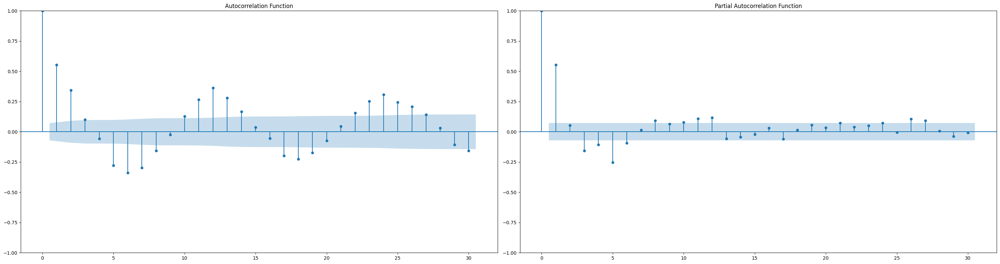

In [ ]:
# Performing the ADF test based on Customer for individual stores(store ids : 2)
plt.figure(figsize=[30, 5])
sal_cust_store_1 = train_store_1['Sales per Customer'].dropna()
Plot_Acf_Pacf(sal_cust_store_1)
plt.show()

                                      SARIMAX Results                                       
Dep. Variable:                            scaled_df   No. Observations:                  751
Model:             SARIMAX(1, 1, 3)x(2, 2, [1], 12)   Log Likelihood                 105.648
Date:                              Fri, 15 Mar 2024   AIC                           -195.295
Time:                                      18:06:57   BIC                           -158.595
Sample:                                           0   HQIC                          -181.132
                                              - 751                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4485      0.102      4.398      0.000       0.249       0.648
ma.L1         -1.00

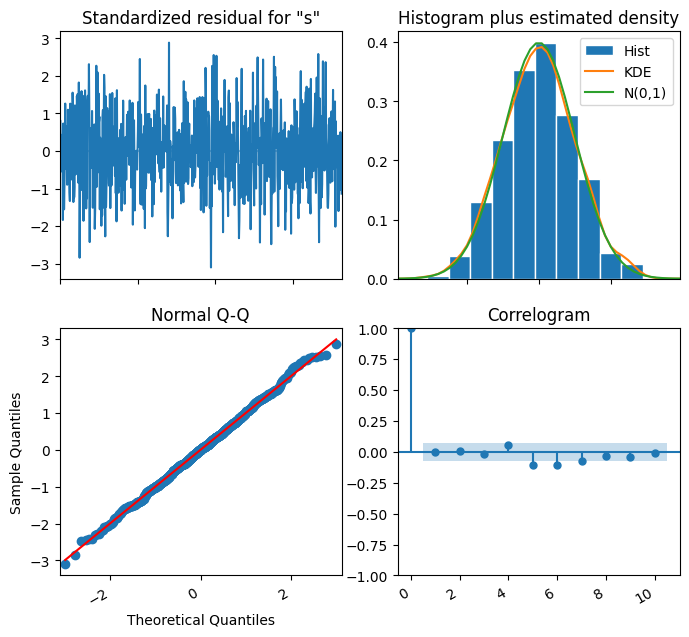

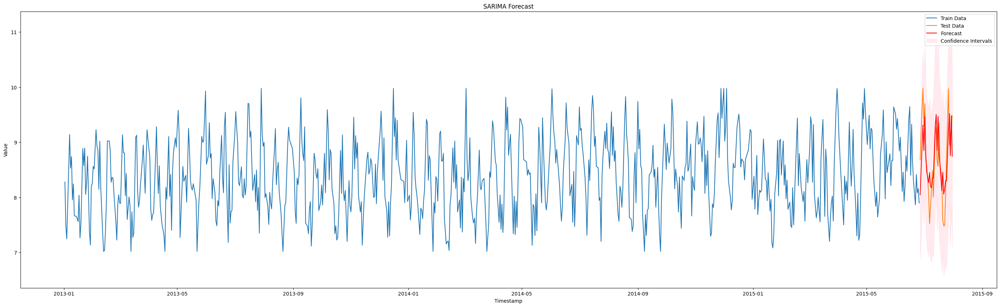

MAE: 0.42305242774914925
RMSE: 0.500714493596996
MAPE: 4.917008775644442


In [ ]:
sarima_forecast(train_store_1['Sales per Customer'], test_store_1['Sales per Customer'],
                order=(1, 1, 3), seasonal_order=(2, 2, 1, 12),
                exog_train=None,
                exog_test=None)

In [ ]:
# Assuming ts is your adjusted time series without closed days
# ts = train_store_1['Sales']

# # Forecast future values
# forecast_steps = 42  # Adjust according to your desired forecast horizon
# forecast_index = pd.date_range(start=ts.index.max() + pd.Timedelta(days=1), periods=forecast_steps, freq='D')
# forecast = model_fit.forecast(steps=forecast_steps)

# # Plot the original data, test data, and forecast
# plt.figure(figsize=(20, 6))
# plt.plot(ts, label='Original Data')
# plt.plot(ts, label='Test Data')
# plt.plot(forecast_index, forecast, label='Forecast')
# plt.title('Forecasting with SARIMAX')
# plt.xlabel('Date')
# plt.ylabel('Sales')
# plt.legend()
# plt.show()

LSTM Forecasting

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout

def lstm_forecast(train_df, test_df, epochs):
    # Convert dataframe to numpy array
    train_data = train_df.values
    test_data = test_df.values

    # Scale the data
    scaler = MinMaxScaler()
    train_scaled = scaler.fit_transform(train_data.reshape(-1, 1))
    test_scaled = scaler.transform(test_data.reshape(-1, 1))

    # Prepare data for LSTM
    X_train, y_train = [], []
    for i in range(len(train_scaled)):
        X_train.append(train_scaled[i:i+1])
        y_train.append(train_scaled[i])
    X_train, y_train = np.array(X_train), np.array(y_train)

    X_test = np.array([test_scaled[i:i+1] for i in range(len(test_scaled))])

    # Build LSTM model
    model = Sequential()
    model.add(LSTM(units=256, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(Dropout(0.2))
    model.add(LSTM(units=256, activation='relu', return_sequences=True))
    model.add(Dropout(0.2))
    model.add(LSTM(units=256, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train LSTM model
    model.fit(X_train, y_train, epochs=epochs, batch_size=32)

    model.save('Model_Cust_per_Sal.h5')
    print("Model saved successfully.")

    # Make predictions
    test_predictions = model.predict(X_test)



    # Inverse scaling for predictions
    test_predictions = scaler.inverse_transform(test_predictions)

    # Plot the original data and the forecast
    plt.figure(figsize=(35, 10))
    plt.plot(train_df.index, train_df.values, label='Train Data')
    plt.plot(test_df.index, test_df.values, label='Test Data')
    plt.plot(test_df.index, test_predictions, color='red', label='Forecast')
    plt.title('LSTM Forecast')
    plt.xlabel('Timestamp')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

        # Calculate metrics
    mae = mean_absolute_error(test_data, test_predictions)
    rmse = np.sqrt(mean_squared_error(test_data, test_predictions))
    print("MAE:", mae)
    print("RMSE:", rmse)

In [ ]:
train_store_1['Sales'].head()

Date
2013-01-02    5530.0
2013-01-03    4327.0
2013-01-04    4486.0
2013-01-05    4997.0
2013-01-07    7176.0
Name: Sales, dtype: float64

Epoch 1/50
24/24 [==============================] - 5s 30ms/step - loss: 0.1142
Epoch 2/50
24/24 [==============================] - 1s 31ms/step - loss: 0.0298
Epoch 3/50
24/24 [==============================] - 1s 30ms/step - loss: 0.0178
Epoch 4/50
24/24 [==============================] - 1s 32ms/step - loss: 0.0057
Epoch 5/50
24/24 [==============================] - 1s 29ms/step - loss: 0.0019
Epoch 6/50
24/24 [==============================] - 1s 30ms/step - loss: 0.0021
Epoch 7/50
24/24 [==============================] - 1s 30ms/step - loss: 0.0015
Epoch 8/50
24/24 [==============================] - 1s 30ms/step - loss: 0.0013
Epoch 9/50
24/24 [==============================] - 1s 30ms/step - loss: 0.0010
Epoch 10/50
24/24 [==============================] - 1s 45ms/step - loss: 9.8903e-04
Epoch 11/50
24/24 [==============================] - 1s 45ms/step - loss: 0.0011
Epoch 12/50
24/24 [==============================] - 1s 45ms/step - loss: 9.4832e-04
Epoch 13/50
24/24 [==========

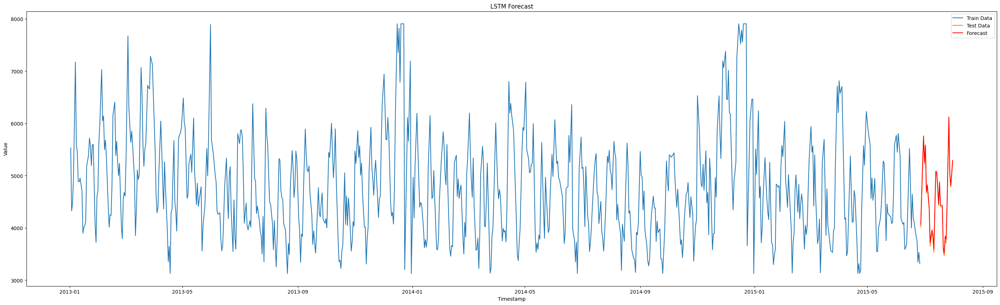

MAE: 41.79590657552083
RMSE: 45.258384500724965


In [ ]:
lstm_forecast(train_store_1['Sales'], test_store_1['Sales'], epochs=50)

Epoch 1/50
24/24 [==============================] - 6s 32ms/step - loss: 0.1035
Epoch 2/50
24/24 [==============================] - 1s 29ms/step - loss: 0.0276
Epoch 3/50
24/24 [==============================] - 1s 29ms/step - loss: 0.0153
Epoch 4/50
24/24 [==============================] - 1s 31ms/step - loss: 0.0044
Epoch 5/50
24/24 [==============================] - 1s 29ms/step - loss: 0.0018
Epoch 6/50
24/24 [==============================] - 1s 31ms/step - loss: 0.0013
Epoch 7/50
24/24 [==============================] - 1s 30ms/step - loss: 0.0011
Epoch 8/50
24/24 [==============================] - 1s 29ms/step - loss: 0.0010
Epoch 9/50
24/24 [==============================] - 1s 30ms/step - loss: 8.5878e-04
Epoch 10/50
24/24 [==============================] - 1s 30ms/step - loss: 9.5321e-04
Epoch 11/50
24/24 [==============================] - 1s 29ms/step - loss: 9.9213e-04
Epoch 12/50
24/24 [==============================] - 1s 35ms/step - loss: 9.1036e-04
Epoch 13/50
24/24 [==

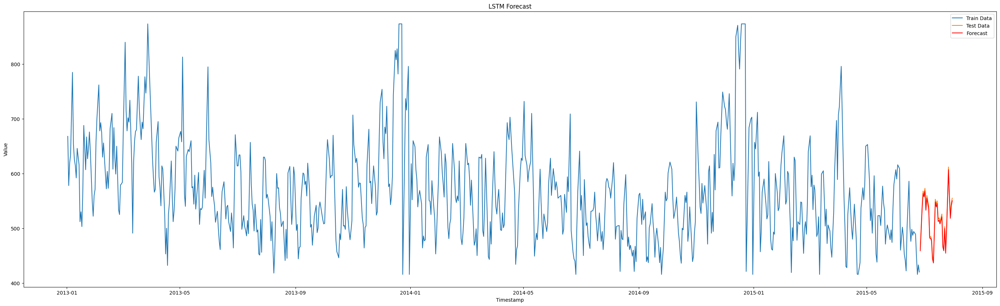

MAE: 4.420233154296875
RMSE: 4.469334985544027


In [ ]:
lstm_forecast(train_store_1['Customers'], test_store_1['Customers'], epochs=50)

Epoch 1/50
24/24 [==============================] - 5s 31ms/step - loss: 0.2052
Epoch 2/50
24/24 [==============================] - 1s 37ms/step - loss: 0.0425
Epoch 3/50
24/24 [==============================] - 1s 44ms/step - loss: 0.0252
Epoch 4/50
24/24 [==============================] - 1s 45ms/step - loss: 0.0136
Epoch 5/50
24/24 [==============================] - 1s 49ms/step - loss: 0.0053
Epoch 6/50
24/24 [==============================] - 1s 31ms/step - loss: 0.0030
Epoch 7/50
24/24 [==============================] - 1s 30ms/step - loss: 0.0023
Epoch 8/50
24/24 [==============================] - 1s 29ms/step - loss: 0.0027
Epoch 9/50
24/24 [==============================] - 1s 30ms/step - loss: 0.0019
Epoch 10/50
24/24 [==============================] - 1s 29ms/step - loss: 0.0019
Epoch 11/50
24/24 [==============================] - 1s 29ms/step - loss: 0.0019
Epoch 12/50
24/24 [==============================] - 1s 29ms/step - loss: 0.0019
Epoch 13/50
24/24 [==================

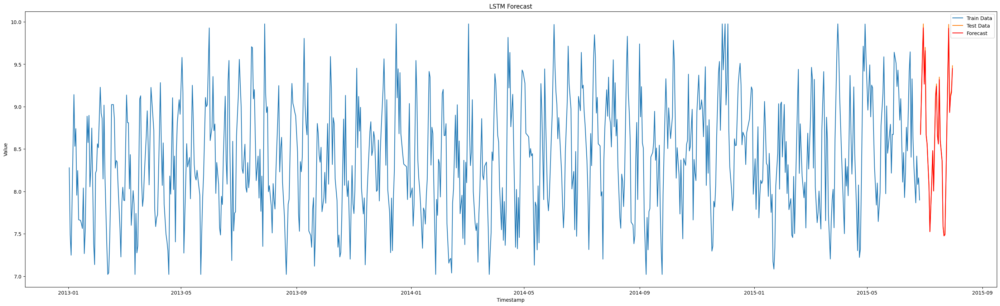

MAE: 0.015302364472141682
RMSE: 0.02134519066505839


In [ ]:
lstm_forecast(train_store_1['Sales per Customer'], test_store_1['Sales per Customer'], epochs=50)

In [ ]:
from keras.models import load_model

# Load the saved model
Sales_model = load_model('Model_Sales.h5')
Cust_model = load_model('Model_Cust.h5')
Sal_Per_Cust_model = load_model('Model_Cust_per_Sal.h5')

In [ ]:
def predict_sales(new_data):
    # Scale the new data using the same scaler used during training
    scaler = MinMaxScaler()
    new_data_scaled = scaler.fit_transform(new_data.values.reshape(-1, 1))

    # Prepare the new data for prediction
    X_new = np.array([new_data_scaled[i:i+1] for i in range(len(new_data_scaled))])

    # Make predictions using the loaded model
    predictions = Sales_model.predict(X_new)

    # Inverse scaling for predictions
    predictions_actual = scaler.inverse_transform(predictions)

        # Plot the original data and the forecast
    plt.figure(figsize=(30, 6))
    plt.plot(new_data.index, new_data, label='Original Data')
    plt.plot(new_data.index, predictions_actual, color='red', label='Forecast')
    plt.title('Sales Forecast')
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.legend()
    plt.show()

1/1 [==============================] - 0s 486ms/step


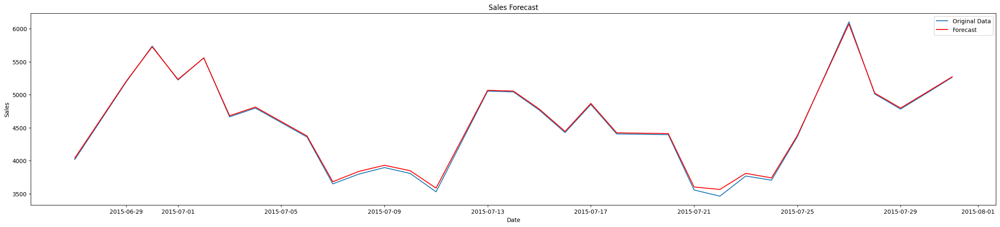

In [ ]:
predict_sales(test_store_1['Sales'])

Observations : Model is prediction on test data is good

In [ ]:
concatenated_df = pd.concat([train_store_1, test_store_1])
concatenated_df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,Sales per Customer,logged_Sales,logged_Customers,logged_Sales per Customer,BoxCox_Sales,BoxCox_Customers,BoxCox_Sales per Customer,Sales_standardized,Customers_standardized,Sales per Customer_standardized,Customers_diff1,Sales per Customer_diff1
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-02,1,3,2013-01-02,5530.0,668.0,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,8.278443,8.617943,6.504288,2.113655,1.753151,0.799007,2.221585,0.786963,1.178350,-0.166831,NaN,NaN
2013-01-03,1,4,2013-01-03,4327.0,578.0,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,7.486159,8.372630,6.359574,2.013056,1.751148,0.798961,2.111062,-0.436923,0.163253,-1.328517,-90.0,-0.792284
2013-01-04,1,5,2013-01-04,4486.0,619.0,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,7.247173,8.408717,6.428105,1.980611,1.751460,0.798984,2.075529,-0.275163,0.625686,-1.678931,41.0,-0.238986
2013-01-05,1,6,2013-01-05,4997.0,635.0,1,0,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,7.869291,8.516593,6.453625,2.062968,1.752357,0.798992,2.165832,0.244709,0.806148,-0.766749,16.0,0.622118
2013-01-07,1,1,2013-01-07,7176.0,785.0,1,1,0,1,3,1,1270.0,9.0,2008.0,0,0.0,0.0,0,9.141401,8.878497,6.665684,2.212814,1.754994,0.799050,2.331041,2.461541,2.497976,1.098482,150.0,1.272110


In [ ]:
def predict_cust_per_sales_skip_sundays(new_data, start_date, forecast_days):
    # Scale the new data using the same scaler used during training
    scaler = MinMaxScaler()
    new_data_scaled = scaler.fit_transform(new_data.values.reshape(-1, 1))

    # Prepare the new data for prediction
    X_new = np.array([new_data_scaled[i:i+1] for i in range(len(new_data_scaled))])

    # Make predictions iteratively, skipping Sundays
    predictions_actual = []
    current_date = pd.to_datetime(start_date)
    days_skipped = 0
    while len(predictions_actual) < forecast_days:
        if current_date.day_name() != 'Sunday':
            # Make prediction using the loaded model
            prediction = Sal_Per_Cust_model.predict(X_new[len(predictions_actual) + days_skipped:len(predictions_actual) + days_skipped + 1])
            predictions_actual.append(prediction[0])
        else:
            days_skipped += 1
        current_date += pd.Timedelta(days=1)

    # Inverse scaling for predictions
    predictions_actual = scaler.inverse_transform(np.array(predictions_actual).reshape(-1, 1))

    # Create date range for forecasted period
    forecast_dates = pd.date_range(start=start_date, periods=forecast_days, freq='D')

    # Plot the original data and the forecast
    plt.figure(figsize=(30, 6))
    plt.plot(new_data.index, new_data, label='Original Data')
    plt.plot(forecast_dates, predictions_actual, color='red', label='Forecast')
    plt.title('Forecasting results (Skipping Sundays)')
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.legend()
    plt.show()

    # Display forecasted values excluding Sundays
    for date, value in zip(forecast_dates, predictions_actual):
        if date.day_name() != 'Sunday':
            print(f"Date: {date}, Forecasting results: {value}")

1/1 [==============================] - 0s 24ms/step


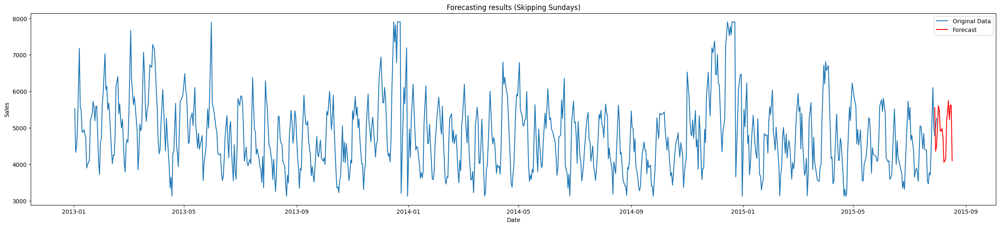

Date: 2015-07-29 00:00:00, Forecasting results: [5558.933]
Date: 2015-07-30 00:00:00, Forecasting results: [4360.285]
Date: 2015-07-31 00:00:00, Forecasting results: [4516.015]
Date: 2015-08-01 00:00:00, Forecasting results: [5027.6753]
Date: 2015-08-03 00:00:00, Forecasting results: [5500.3945]
Date: 2015-08-04 00:00:00, Forecasting results: [4922.408]
Date: 2015-08-05 00:00:00, Forecasting results: [4911.3687]
Date: 2015-08-06 00:00:00, Forecasting results: [4982.5845]
Date: 2015-08-07 00:00:00, Forecasting results: [4746.549]
Date: 2015-08-08 00:00:00, Forecasting results: [4057.7378]
Date: 2015-08-10 00:00:00, Forecasting results: [4166.2593]
Date: 2015-08-11 00:00:00, Forecasting results: [5212.6724]
Date: 2015-08-12 00:00:00, Forecasting results: [5423.8926]
Date: 2015-08-13 00:00:00, Forecasting results: [5746.965]
Date: 2015-08-14 00:00:00, Forecasting results: [5225.6494]
Date: 2015-08-15 00:00:00, Forecasting results: [5614.43]
Date: 2015-08-17 00:00:00, Forecasting results: 

In [ ]:
predict_sales_skip_sundays(concatenated_df['Sales'], start_date='2015-07-29', forecast_days=20)

Results : Forecasting the future Sales on the Store in upcoming 4 weeks

1/1 [==============================] - 0s 25ms/step


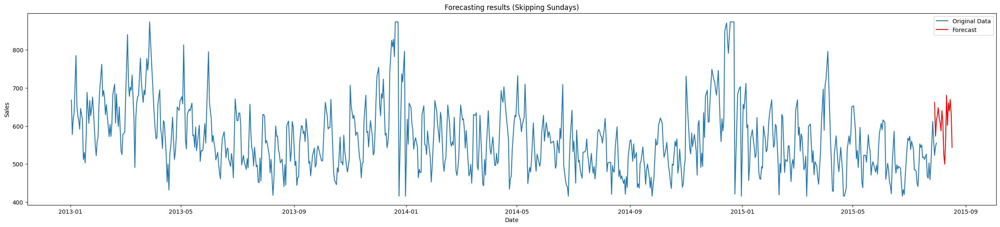

Date: 2015-07-29 00:00:00, Forecasting results: [661.67334]
Date: 2015-07-30 00:00:00, Forecasting results: [573.3787]
Date: 2015-07-31 00:00:00, Forecasting results: [613.8766]
Date: 2015-08-01 00:00:00, Forecasting results: [629.49304]
Date: 2015-08-03 00:00:00, Forecasting results: [620.7097]
Date: 2015-08-04 00:00:00, Forecasting results: [609.96265]
Date: 2015-08-05 00:00:00, Forecasting results: [587.3019]
Date: 2015-08-06 00:00:00, Forecasting results: [640.22455]
Date: 2015-08-07 00:00:00, Forecasting results: [610.9475]
Date: 2015-08-08 00:00:00, Forecasting results: [524.81024]
Date: 2015-08-10 00:00:00, Forecasting results: [563.35614]
Date: 2015-08-11 00:00:00, Forecasting results: [681.1258]
Date: 2015-08-12 00:00:00, Forecasting results: [602.0823]
Date: 2015-08-13 00:00:00, Forecasting results: [660.6989]
Date: 2015-08-14 00:00:00, Forecasting results: [639.24915]
Date: 2015-08-15 00:00:00, Forecasting results: [669.46136]
Date: 2015-08-17 00:00:00, Forecasting results: 

In [ ]:
predict_cust_skip_sundays(concatenated_df['Customers'], start_date='2015-07-29', forecast_days=20)

Results : Forecasting the future Customers purchase from the Store in upcoming 4 weeks

1/1 [==============================] - 0s 30ms/step


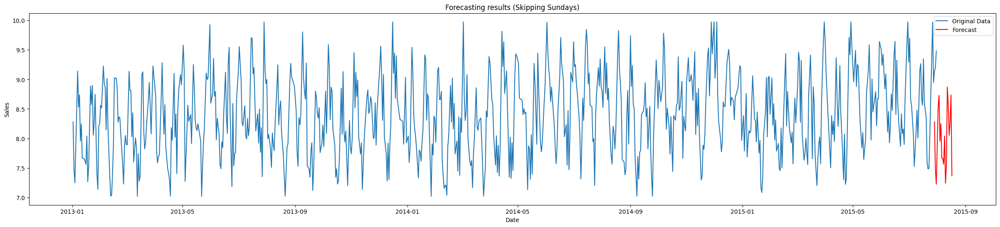

Date: 2015-07-29 00:00:00, Forecasting results: [8.282491]
Date: 2015-07-30 00:00:00, Forecasting results: [7.4794416]
Date: 2015-07-31 00:00:00, Forecasting results: [7.222523]
Date: 2015-08-01 00:00:00, Forecasting results: [7.8670464]
Date: 2015-08-03 00:00:00, Forecasting results: [8.72881]
Date: 2015-08-04 00:00:00, Forecasting results: [7.9531736]
Date: 2015-08-05 00:00:00, Forecasting results: [8.249013]
Date: 2015-08-06 00:00:00, Forecasting results: [7.6640205]
Date: 2015-08-07 00:00:00, Forecasting results: [7.65546]
Date: 2015-08-08 00:00:00, Forecasting results: [7.5621223]
Date: 2015-08-10 00:00:00, Forecasting results: [7.241]
Date: 2015-08-11 00:00:00, Forecasting results: [7.530788]
Date: 2015-08-12 00:00:00, Forecasting results: [8.870341]
Date: 2015-08-13 00:00:00, Forecasting results: [8.571107]
Date: 2015-08-14 00:00:00, Forecasting results: [8.054158]
Date: 2015-08-15 00:00:00, Forecasting results: [8.267374]
Date: 2015-08-17 00:00:00, Forecasting results: [7.36789

In [ ]:
predict_cust_per_sales_skip_sundays(concatenated_df['Sales per Customer'], start_date='2015-07-29', forecast_days=20)

Results : Forecasting the future Sales per Customer from the Store in upcoming 4 weeks